# JustEat TakeAway.com - Senior Data Scientist Challenge
--------
--------

Author: Vasco Fernandes

### Background

The Metropolitan Transit Authority, MTA runs the subway and buses in NYC. In order to better plan staff at various subway stations to serve passengers, it’s essential to understand the historical traffic pattern. Furthermore, realistic forecasting on ridership is important for staff planners to assess how many staff members are needed over time.

### Structure

1. Data Collection
   - Download the data from MTA (link below).
   - Calculate the hourly ridership column per stations/area - this would be your response / label to predict.
2. Descriptive Analysis
   - Provide relevant insights that you find from your exploratory data analysis with visuals and the inferences you make.
3. Forecasting Ridership
   - Pick 8 stations/areas and forecast the expected number of passengers on an hourly basis for a
period of two weeks into the future. Evaluate the performance of your model(s) for the first two weeks of Mar 2022, Feb 2023 and Jan 2024.
   - The stations you choose should be picked from each of the 4 quartiles, equally, based on the average daily ridership levels for the entire dataset. This is only used to choose the stations, the forecast is still on an hourly basis.


# Importing Libraries

In [2]:
import pandas as pd
import numpy as np
from sklearn.cluster import DBSCAN
from geopy.distance import great_circle
from shapely.geometry import MultiPoint

import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.basemap import Basemap
import plotly.express as px

from prophet import Prophet
from sklearn.linear_model import LinearRegression
from lightgbm import LGBMRegressor
from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error

# Setting the visual style for seaborn
sns.set_style("whitegrid")

# Read the Data

In [3]:
df = pd.read_csv("MTA_Subway_Hourly_Ridership__Beginning_February_2022_20240415.csv")

/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/2430532948.py:1: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("MTA_Subway_Hourly_Ridership__Beginning_February_2022_20240415.csv")


In [4]:
df.shape

(54850601, 12)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54850601 entries, 0 to 54850600
Data columns (total 12 columns):
 #   Column               Dtype  
---  ------               -----  
 0   transit_timestamp    object 
 1   transit_mode         object 
 2   station_complex_id   object 
 3   station_complex      object 
 4   borough              object 
 5   payment_method       object 
 6   fare_class_category  object 
 7   ridership            int64  
 8   transfers            int64  
 9   latitude             float64
 10  longitude            float64
 11  Georeference         object 
dtypes: float64(2), int64(2), object(8)
memory usage: 4.9+ GB


| Data Label          | Data Type    | Data Description                                                                                                                                                                                      |
|---------------------|--------------|-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| transit_timestamp   |     DATE     | Timestamp payment took place in local time. All transactions here are rounded down to the nearest hour. For example, a swipe that took place at 1:37pm will be reported as having taken place at 1pm. |
| transit_mode        | TEXT         | Distinguishes between the subway, Staten Island Railway, and the Roosevelt Island Tram                                                                                                                |
| station_complex_id  | ALPHANUMERIC | A unique identifier for station complexes                                                                                                                                                             |
| station_complex     | TEXT         | The subway complex where an entry swipe or tap took place. Large subway complexes, such as Times Square and Fulton Center, may contain multiple subway lines.                                         |
| borough             | TEXT         | Represents one of the boroughs of New York City serviced by the subway system (Bronx, Brooklyn, Manhattan, Queens).                                                                                   |
| payment_method      | TEXT         | Specifies whether the payment method used to enter was from OMNY or MetroCard.                                                                                                                        |
| fare_class_category | TEXT         | The class of fare payment used for the trip.                                                                                                                                                          |
| ridership           | NUMERIC      | Total number of riders that entered a subway complex                                                                                                                                                  |
| transfers           | NUMERIC      | Number of individuals who entered a subway complex via a free bus-to-subway, or free out-of-network transfer.                                                                                         |
| latitude            | DECIMAL      | Latitude for the specified subway complex                                                                                                                                                             |
| longitude           | DECIMAL      | Longitude for the specified subway complex                                                                                                                                                            |

In [6]:
df.head(2)

,transit_timestamp,transit_mode,station_complex_id,station_complex,borough,payment_method,fare_class_category,ridership,transfers,latitude,longitude,Georeference
0,04/30/2023 04:00:00 AM,subway,416,Wakefield-241 St (2),Bronx,metrocard,Metrocard - Unlimited 7-Day,2,0,40.903126,-73.850616,POINT (-73.85061645507812 40.90312576293945)
1,08/03/2023 06:00:00 AM,subway,416,Wakefield-241 St (2),Bronx,metrocard,Metrocard - Unlimited 30-Day,33,0,40.903126,-73.850616,POINT (-73.85061645507812 40.90312576293945)


Enforce types per the descritpion:

In [7]:
df["station_complex_id"] = df["station_complex_id"].astype(str)
df["transit_timestamp"] = pd.to_datetime(df["transit_timestamp"])

In [8]:
df['hour'] = df['transit_timestamp'].dt.hour
df['day_of_week'] = df['transit_timestamp'].dt.dayofweek
df['month'] = df['transit_timestamp'].dt.month
df['date'] = df['transit_timestamp'].dt.date
df['is_weekend'] = df['day_of_week'].apply(lambda x: True if x >= 5 else False)  # Saturday and Sunday are considered as weekend 

## Basic Stats

In [9]:
df.station_complex_id.nunique()

428

In [10]:
df.station_complex.nunique()

428

In [11]:
df.transit_mode.unique().tolist()

['subway', 'staten_island_railway', 'tram']

In [12]:
df.borough.unique().tolist()

['Bronx', 'Brooklyn', 'Manhattan', 'Queens', 'Staten Island']

In [13]:
df.payment_method.unique().tolist()

['metrocard', 'omny']

In [14]:
df.fare_class_category.unique().tolist()

['Metrocard - Unlimited 7-Day',
 'Metrocard - Unlimited 30-Day',
 'OMNY - Full Fare',
 'Metrocard - Full Fare',
 'Metrocard - Fair Fare',
 'Metrocard - Other',
 'OMNY - Seniors & Disability',
 'OMNY - Other',
 'Metrocard - Students',
 'Metrocard - Seniors & Disability']

In [15]:
df.Georeference.nunique()

976

#### Dataset Overview

- **Stations**: There are `428` unique station complex IDs in the dataset.
- **Transit Modes**: The dataset includes different transit modes such as:
  - Subway
  - Staten Island Railway
  - Tram
- **Borough Distribution**: The data spans across multiple boroughs, including:
  - Bronx
  - Brooklyn
  - Manhattan
  - Queens
  - Staten Island
- **Payment Options**: Payment methods recorded in the data:
  - Metrocard
  - OMNY
- **Fare Categories**: Various fare class categories are present such as:
  - Metrocard – Unlimited 7-Day
  - Metrocard – Unlimited 30-Day
  - OMNY – Full Fare
  - Metrocard – Full Fare
  - Metrocard – Fair Fare
  - Metrocard – Other
  - OMNY – Seniors & Disability
  - OMNY – Other
  - Metrocard – Students
  - Metrocard – Seniors & Disability
- **Georeferences**: The dataset contains `976` unique geolocation references.


# EDA

### Breakdown by Borough

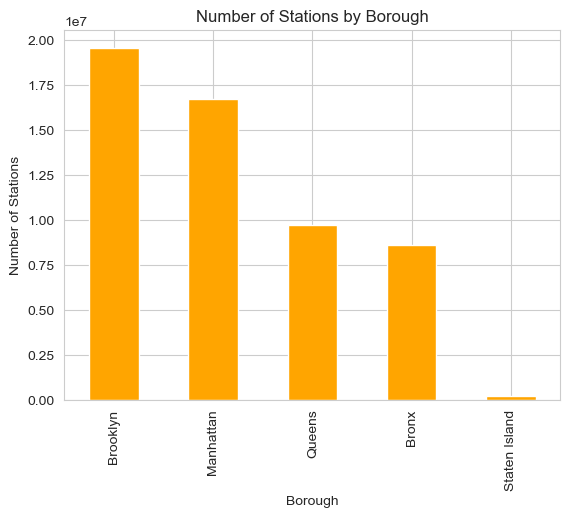

In [18]:
stations_by_borough = df['borough'].value_counts()
stations_by_borough.plot(kind='bar', color="orange")

plt.xlabel('Borough')
plt.ylabel('Number of Stations')
plt.title('Number of Stations by Borough')
plt.show()

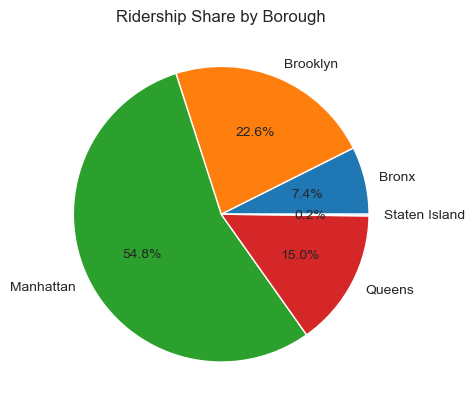

In [19]:
ridership_by_borough = df.groupby('borough')['ridership'].sum()
ridership_by_borough.plot(kind='pie', autopct='%1.1f%%')
plt.ylabel('')
plt.title('Ridership Share by Borough')
plt.show()

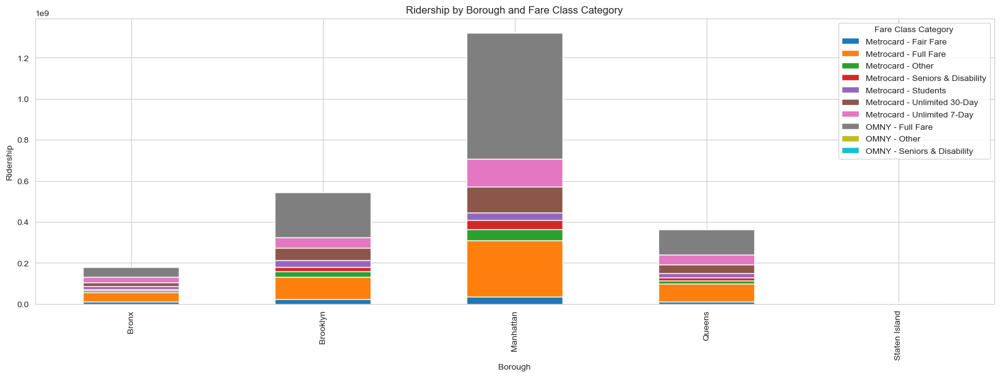

In [20]:
ridership_by_borough_fare = df.groupby(['borough', 'fare_class_category'])['ridership'].sum().unstack()
ridership_by_borough_fare.plot(kind='bar', stacked=True, figsize=(20, 6))
plt.xlabel('Borough')
plt.ylabel('Ridership')
plt.title('Ridership by Borough and Fare Class Category')
plt.legend(title='Fare Class Category')
plt.show()

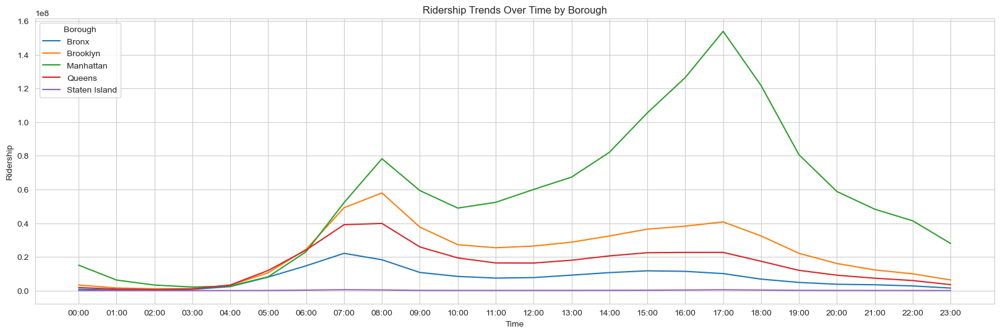

In [24]:
ridership_over_time_by_borough = df.groupby(['hour', 'borough'])['ridership'].sum()
ridership_over_time_by_borough = ridership_over_time_by_borough.unstack()

ridership_over_time_by_borough.plot(figsize=(20, 6))
plt.xlabel('Time')
plt.ylabel('Ridership')
plt.title('Ridership Trends Over Time by Borough')
plt.xticks(range(24), [f'{hour:02}:00' for hour in range(24)])  # Format x-axis ticks as HH:00
plt.legend(title='Borough', loc='upper left')
plt.show()

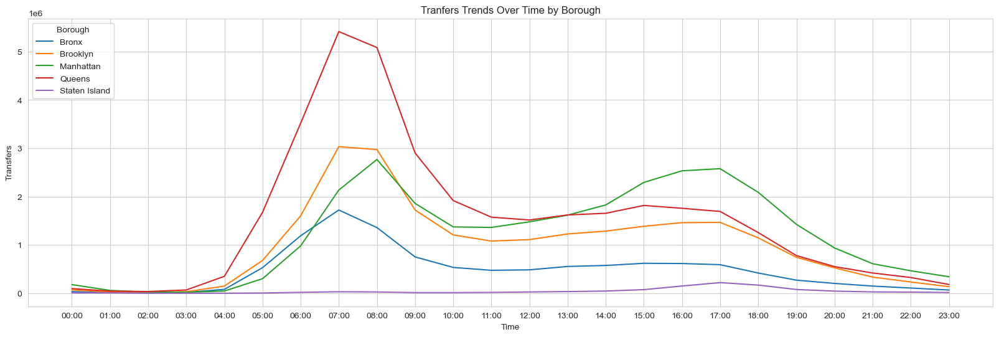

In [25]:
ridership_over_time_by_borough = df.groupby(['hour', 'borough'])['transfers'].sum()
ridership_over_time_by_borough = ridership_over_time_by_borough.unstack()

ridership_over_time_by_borough.plot(figsize=(20, 6))
plt.xlabel('Time')
plt.ylabel('Transfers')
plt.title('Tranfers Trends Over Time by Borough')
plt.xticks(range(24), [f'{hour:02}:00' for hour in range(24)])  # Format x-axis ticks as HH:00
plt.legend(title='Borough', loc='upper left')
plt.show()

In [16]:
def plot_map(df, borough):
    
    plt.figure(figsize=(10, 8))

    df = df[df["borough"] == borough]
    
    m = Basemap(projection='cyl', resolution='i',
                llcrnrlat = df['latitude'].min(), 
                llcrnrlon = df['longitude'].min(),
                urcrnrlat = df['latitude'].max(), 
                urcrnrlon = df['longitude'].max())
    
    m.arcgisimage(service='NatGeo_World_Map', 
                  xpixels=1500, verbose=True)
    
    for line in df.iterrows():
        x,y = m(line[1]['longitude'],line[1]['latitude'])
        size = line[1]['ridership'] / 1500000
        plt.plot(x, y, 'o', markersize=size, color='red', alpha=0.7,
                 markeredgewidth=1, markeredgecolor='white')
       
    plt.show()

In [19]:
df_station = df.groupby(['station_complex_id', 'borough']).agg({
    'ridership': 'sum',
    'latitude': 'mean',
    'longitude': 'mean'
}).reset_index()

**Attention: Doing the average of geographical coordinates is wrong, but done here by simplicity. The correct approach would be to cluster the points using a density-based algorithm (like DBSCAN) that can take an adequate distance as metric (haversine distance). This was not possible due to memory constraints.**

http://server.arcgisonline.com/ArcGIS/rest/services/NatGeo_World_Map/MapServer/export?bbox=-74.01406896467152,40.70300923421154,-73.90982866195452,40.874560966166094&bboxSR=4326&imageSR=4326&size=1500,2468&dpi=96&format=png32&transparent=true&f=image


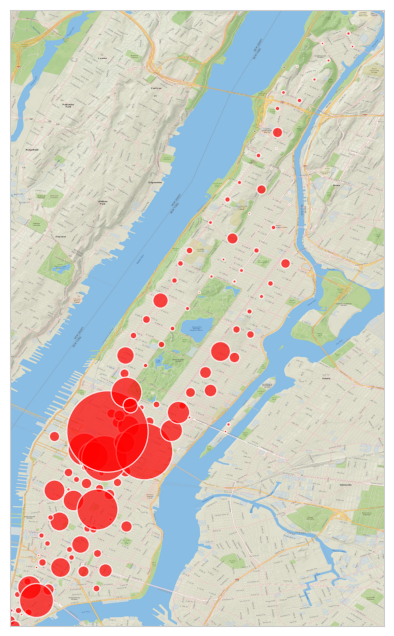

In [20]:
plot_map(df_station, borough="Manhattan")

http://server.arcgisonline.com/ArcGIS/rest/services/NatGeo_World_Map/MapServer/export?bbox=-73.95358206514202,40.5809020742013,-73.75540118838111,40.77503589535349&bboxSR=4326&imageSR=4326&size=1500,1469&dpi=96&format=png32&transparent=true&f=image


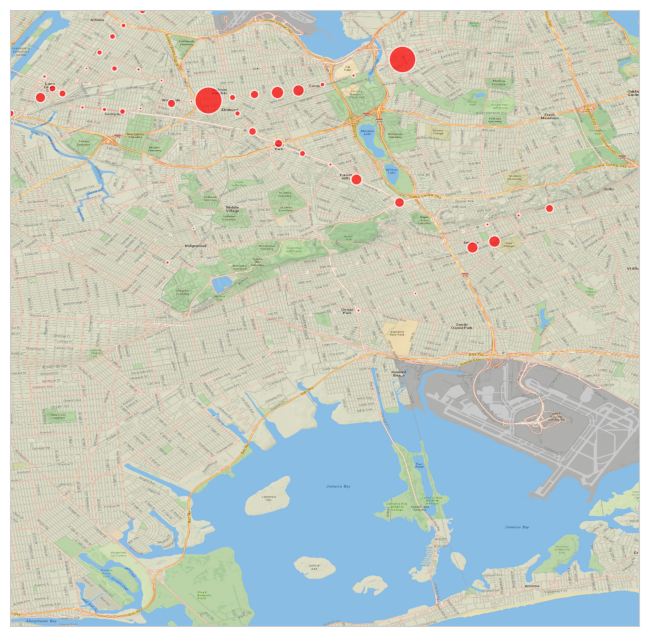

In [113]:
plot_map(df_station, borough="Queens")

http://server.arcgisonline.com/ArcGIS/rest/services/NatGeo_World_Map/MapServer/export?bbox=-74.03087611664468,40.57612607403856,-73.86505095392637,40.73135382402323&bboxSR=4326&imageSR=4326&size=1500,1404&dpi=96&format=png32&transparent=true&f=image


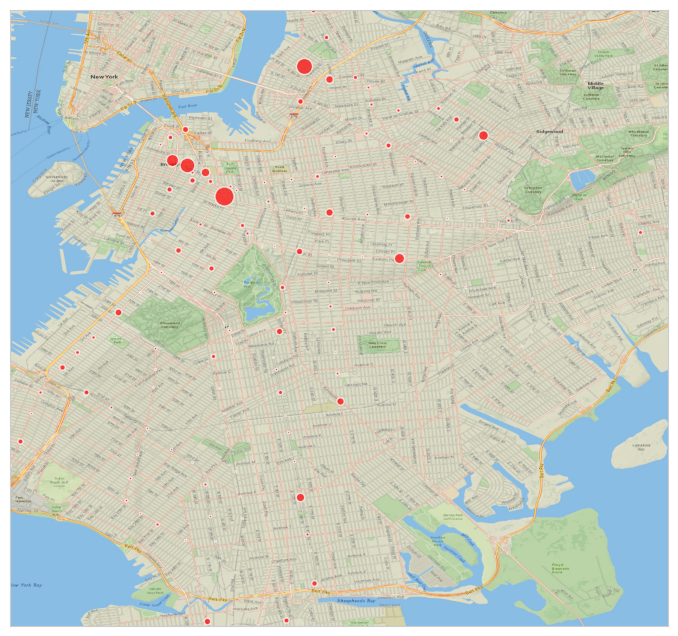

In [115]:
plot_map(df_station, borough="Brooklyn")

http://server.arcgisonline.com/ArcGIS/rest/services/NatGeo_World_Map/MapServer/export?bbox=-73.92984830964008,40.80536664054612,-73.82811805764119,40.90312582318871&bboxSR=4326&imageSR=4326&size=1500,1441&dpi=96&format=png32&transparent=true&f=image


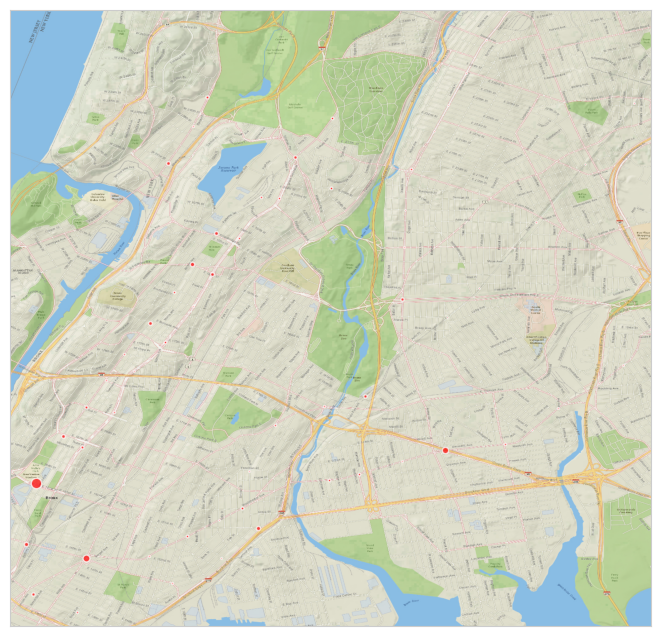

In [116]:
plot_map(df_station, borough="Bronx")

#### Commuters Breakdown

In [15]:
def classify_commuter(row):
    hour = row['transit_timestamp'].hour
    if 5 < hour < 10:
        return 'Morning Commuters'
    elif 15 < hour < 22:
        return 'Afternoon Commuters'
    else:
        return 'Other'
        
df['time_of_day'] = df.apply(classify_commuter, axis=1)
grouped_data = df.groupby(['borough', 'time_of_day'])['ridership'].sum().reset_index()

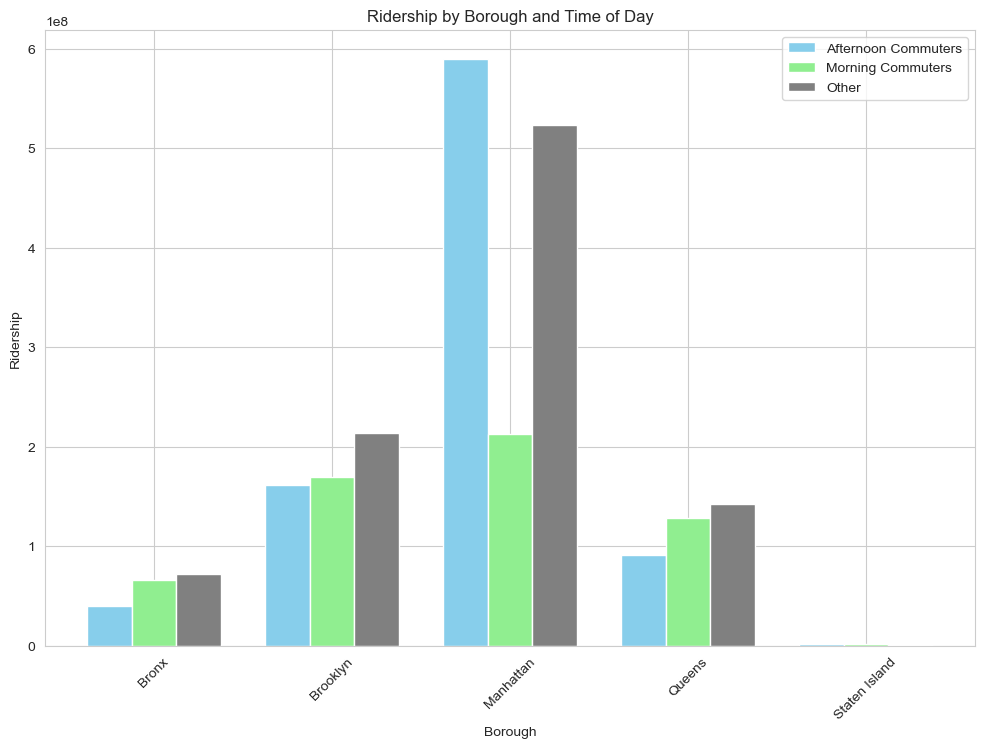

In [17]:
plt.figure(figsize=(12, 8))
ax = plt.subplot()

time_categories = grouped_data['time_of_day'].unique()

colors = ['skyblue', 'lightgreen', 'gray']
time_to_color = dict(zip(time_categories, colors))

boroughs = grouped_data['borough'].unique()
x = np.arange(len(boroughs))
width = 0.25

for i, time in enumerate(time_categories):
    time_df = grouped_data[grouped_data['time_of_day'] == time]
    ax.bar(x + i * width, time_df['ridership'], width, label=time, color=time_to_color[time])

ax.set_xlabel('Borough')
ax.set_ylabel('Ridership')
ax.set_title('Ridership by Borough and Time of Day')
ax.set_xticks(x + width)
ax.set_xticklabels(boroughs)
ax.legend()
plt.xticks(rotation=45)
plt.show()

### Breakdown by Day Period

In [6]:
b = [0,4,8,12,16,20,24]
l = ['Late Night', 'Early Morning','Morning','Noon','Eve','Night']
df['session'] = pd.cut(df['hour'], bins=b, labels=l, include_lowest=True)

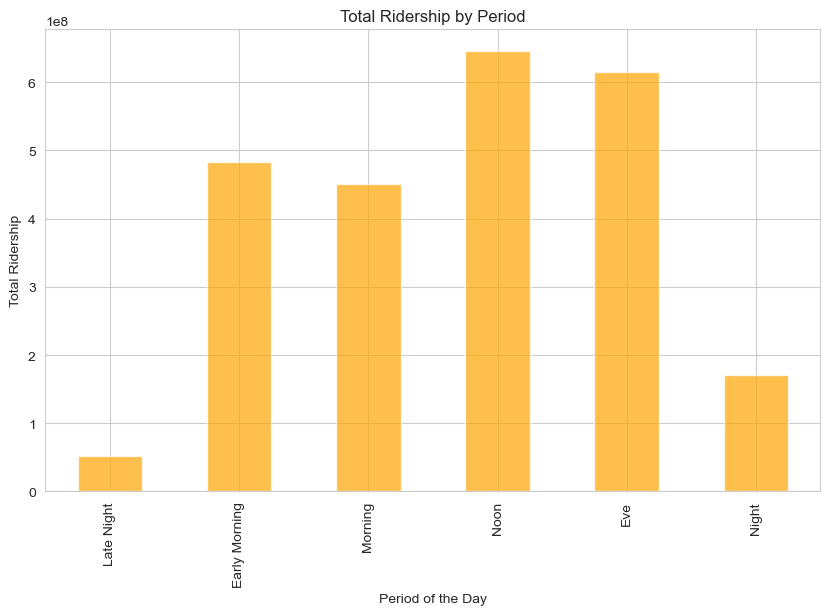

In [15]:
session_ridership = df.groupby('session')['ridership'].sum()

plt.figure(figsize=(10,6))
session_ridership.plot(kind='bar', color='orange', alpha=0.7)
plt.title('Total Ridership by Period')
plt.xlabel('Period of the Day')
plt.ylabel('Total Ridership')
plt.show()

#### Breakdown Week / Weekend

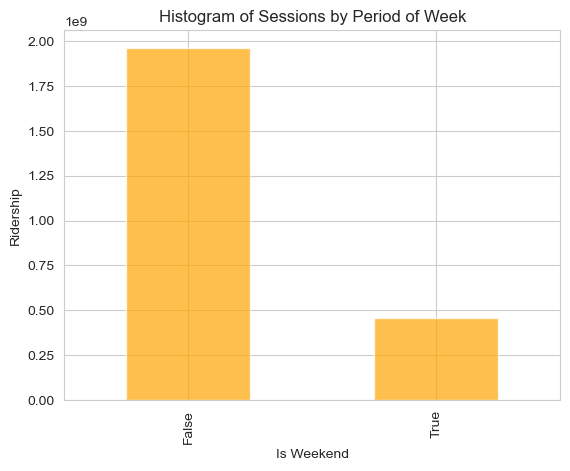

In [14]:
session_ridership = df.groupby(['is_weekend'])['ridership'].sum()
session_ridership.plot(kind='bar', color='orange', alpha=0.7)

plt.xlabel('Is Weekend')
plt.ylabel('Ridership')
plt.title('Histogram of Sessions by Period of Week')
plt.show()

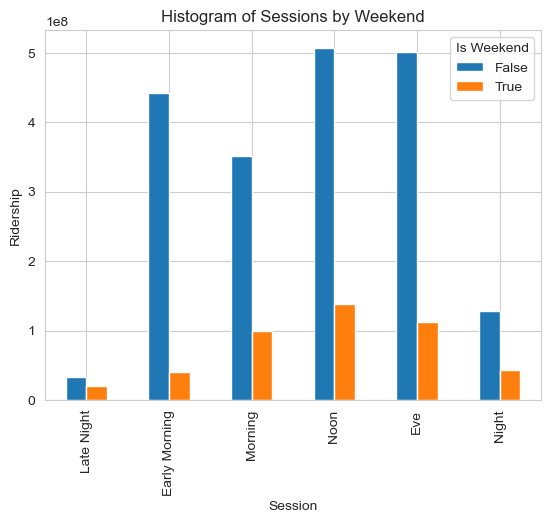

In [15]:
session_ridership = df.groupby(['session', 'is_weekend'])['ridership'].sum()

pivot_df = session_ridership.unstack()
pivot_df.plot(kind='bar')

plt.xlabel('Session')
plt.ylabel('Ridership')
plt.title('Histogram of Sessions by Weekend')
plt.legend(title='Is Weekend')
plt.show()

### Breakdown by Day of Week

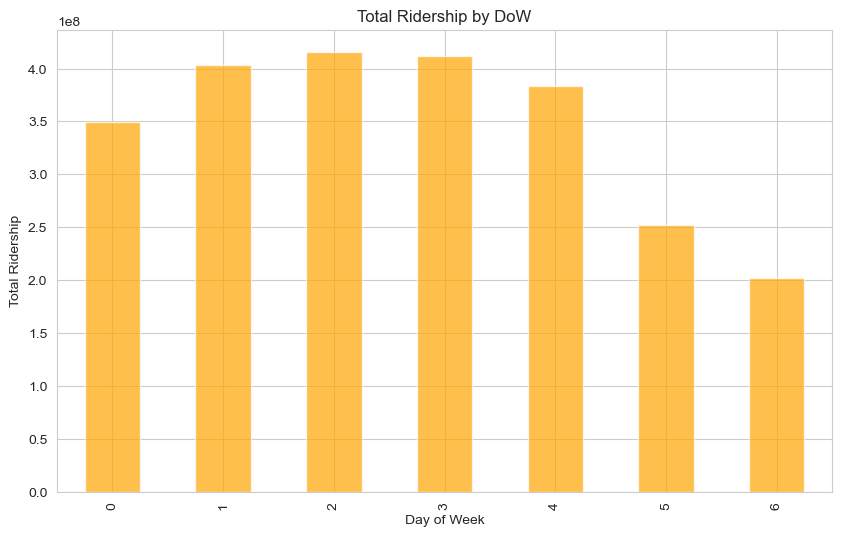

In [109]:
dwo_ridership = df.groupby('day_of_week')['ridership'].sum()

plt.figure(figsize=(10,6))
dwo_ridership.plot(kind='bar', color='orange', alpha=0.7)
plt.title('Total Ridership by DoW')
plt.xlabel('Day of Week')
plt.ylabel('Total Ridership')
plt.show()

### Breakdown by hour

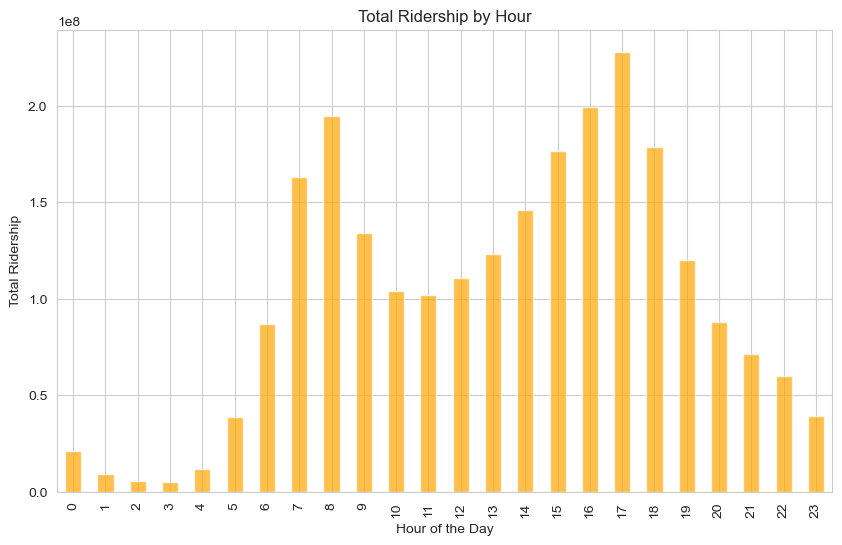

In [112]:
hour_ridership = df.groupby('hour')['ridership'].sum()

plt.figure(figsize=(10,6))
hour_ridership.plot(kind='bar', color='orange', alpha=0.7)
plt.title('Total Ridership by Hour')
plt.xlabel('Hour of the Day')
plt.ylabel('Total Ridership')
plt.show()

### Breakdown by Month

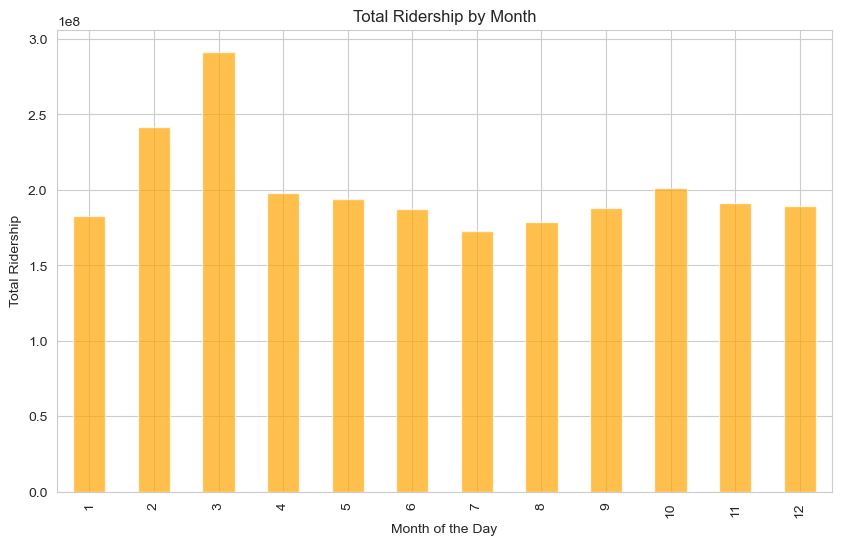

In [113]:
monthly_ridership = df.groupby('month')['ridership'].sum()

plt.figure(figsize=(10,6))
monthly_ridership.plot(kind='bar', color='orange', alpha=0.7)
plt.title('Total Ridership by Month')
plt.xlabel('Month of the Day')
plt.ylabel('Total Ridership')
plt.show()

### Breakdown by Transit Mode

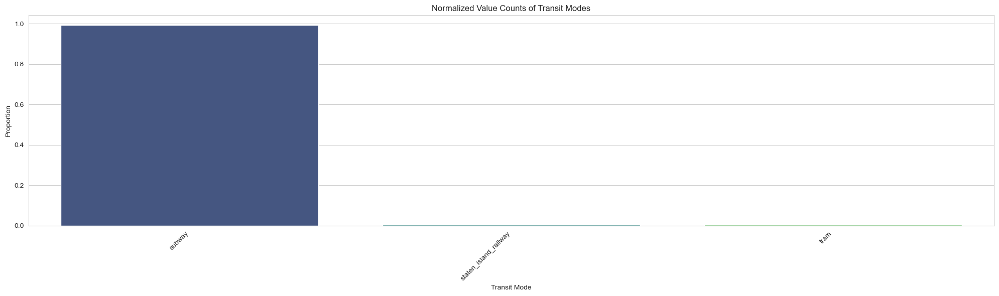

In [31]:
transit_mode_counts = df['transit_mode'].value_counts(normalize=True)

plt.figure(figsize=(20, 6))
sns.barplot(x=transit_mode_counts.index, y=transit_mode_counts.values, palette='viridis')
plt.title('Normalized Value Counts of Transit Modes')
plt.xlabel('Transit Mode')
plt.ylabel('Proportion')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Breakdown by Fare Class

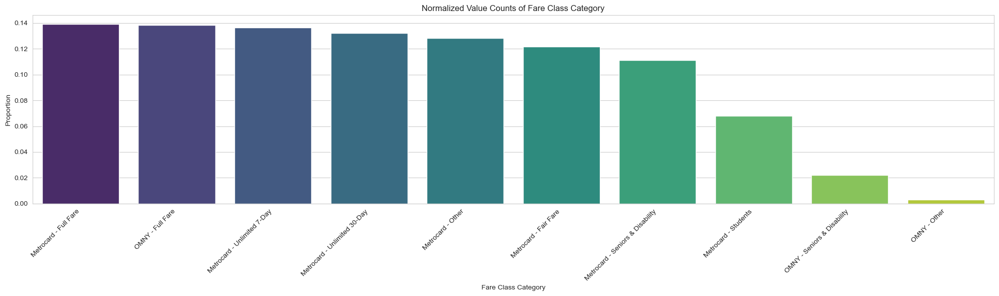

In [33]:
fare_class_category_counts = df['fare_class_category'].value_counts(normalize=True)

plt.figure(figsize=(20, 6))
sns.barplot(x=fare_class_category_counts.index, y=fare_class_category_counts.values, palette='viridis')
plt.title('Normalized Value Counts of Fare Class Category')
plt.xlabel('Fare Class Category')
plt.ylabel('Proportion')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

This histograms suggests different cost structures

### Breakdown by Payment Method

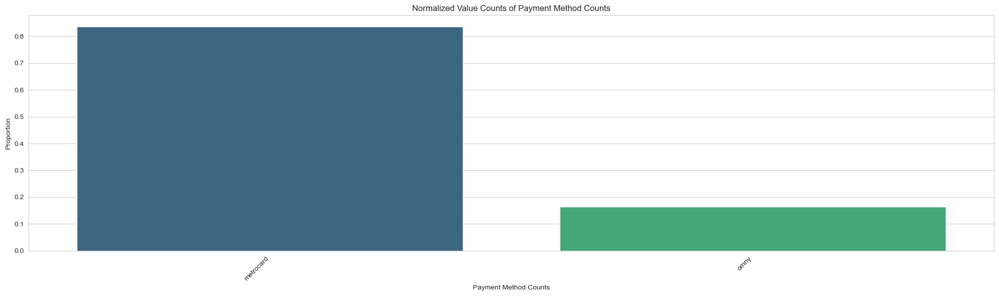

In [35]:
payment_method_counts = df['payment_method'].value_counts(normalize=True)

plt.figure(figsize=(20, 6))
sns.barplot(x=payment_method_counts.index, y=payment_method_counts.values, palette='viridis')
plt.title('Normalized Value Counts of Payment Method Counts')
plt.xlabel('Payment Method Counts')
plt.ylabel('Proportion')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Breakdown by Station

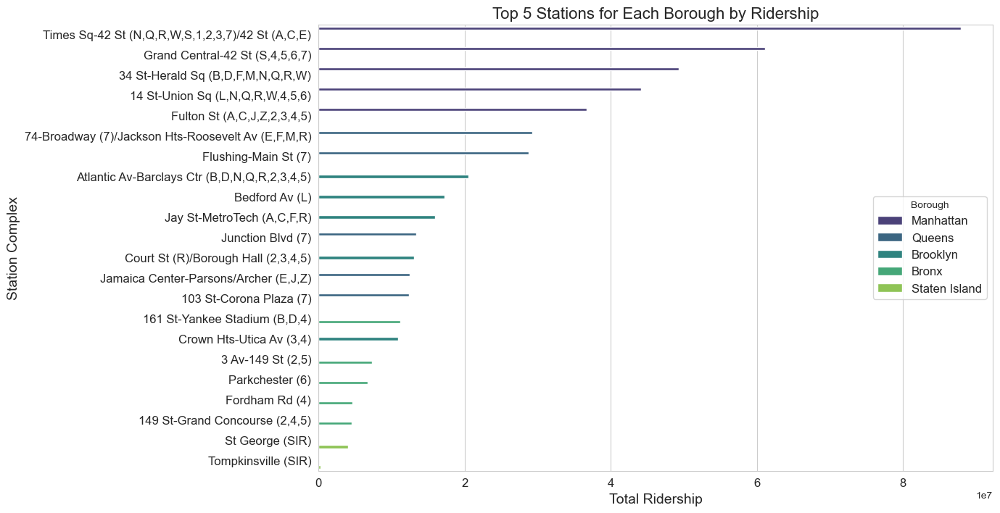

In [22]:
station_borough_ridership = df.groupby(['station_complex', 'borough'])['ridership'].sum().reset_index()

# select the top N stations for each borough based on ridership
def top_n_stations_by_borough(df, n=5):
    return df.groupby('borough').apply(lambda x: x.nlargest(n, 'ridership')).reset_index(drop=True)

top_stations_by_borough = top_n_stations_by_borough(station_borough_ridership)
top_stations_by_borough = top_stations_by_borough.sort_values(by='ridership', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='ridership', y='station_complex', hue='borough', data=top_stations_by_borough, palette='viridis')
plt.xlabel('Total Ridership', fontsize=14)
plt.ylabel('Station Complex', fontsize=14)
plt.title('Top 5 Stations for Each Borough by Ridership', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='Borough', fontsize=12)
plt.show()

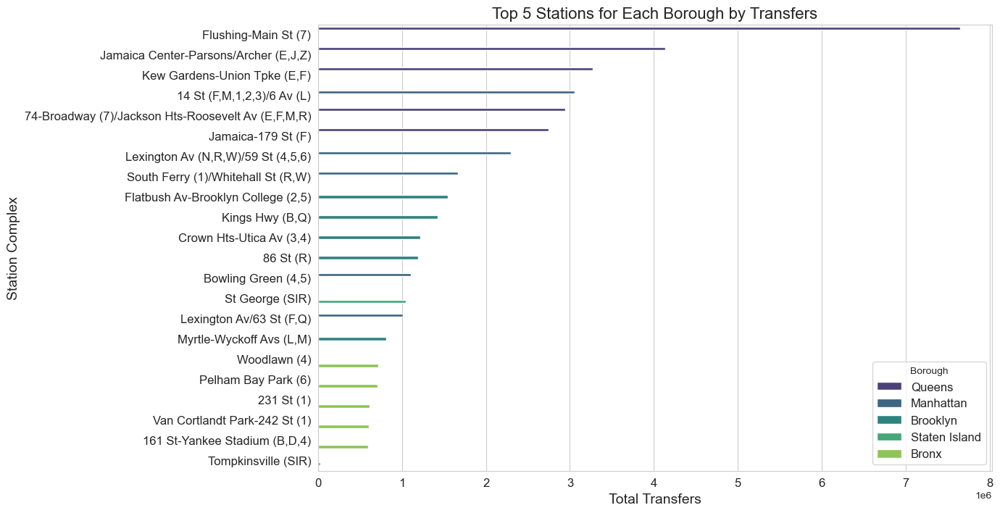

In [23]:
station_borough_transfers = df.groupby(['station_complex', 'borough'])['transfers'].sum().reset_index()

top_stations_by_borough = top_n_stations_by_borough(station_borough_transfers)
top_stations_by_borough = top_stations_by_borough.sort_values(by='transfers', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='transfers', y='station_complex', hue='borough', data=top_stations_by_borough, palette='viridis')
plt.xlabel('Total Transfers', fontsize=14)
plt.ylabel('Station Complex', fontsize=14)
plt.title('Top 5 Stations for Each Borough by Transfers', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='Borough', fontsize=12)
plt.show()

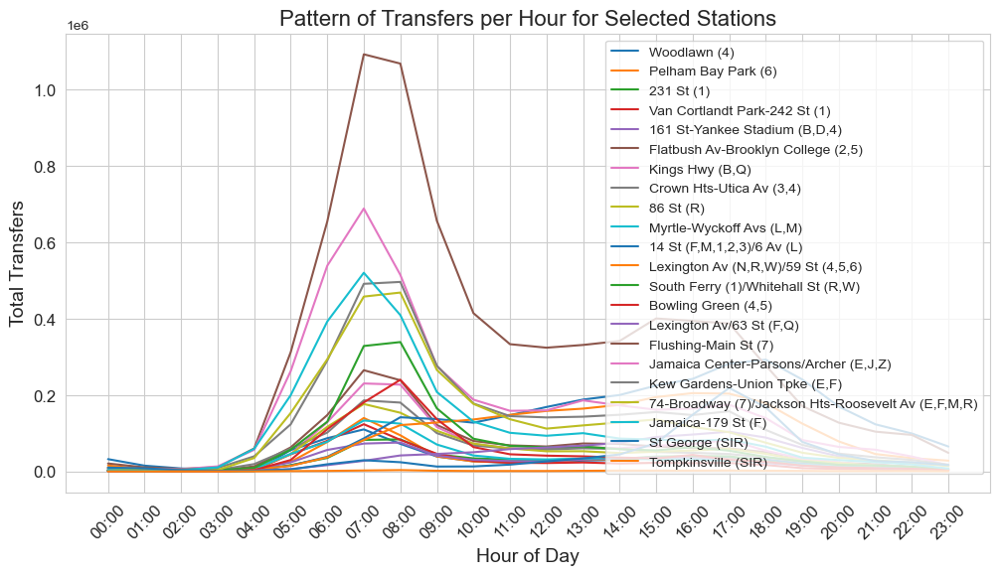

In [19]:
station_borough_transfers = df.groupby(['station_complex', 'borough'])['transfers'].sum().reset_index()

top_stations_by_borough = top_n_stations_by_borough(station_borough_transfers)

# extract the station complex names from the top stations DataFrame
selected_stations = top_stations_by_borough['station_complex'].unique()
selected_df = df[df['station_complex'].isin(selected_stations)]

plt.figure(figsize=(12, 6))
for station in selected_stations:
    station_data = selected_df[selected_df['station_complex'] == station]
    hourly_transfers = station_data.groupby('hour')['transfers'].sum()
    hourly_transfers.plot(label=station)

plt.xlabel('Hour of Day', fontsize=14)
plt.ylabel('Total Transfers', fontsize=14)
plt.title('Pattern of Transfers per Hour for Selected Stations', fontsize=16)
plt.xticks(range(24), labels=[f'{h:02}:00' for h in range(24)], rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=10)
plt.grid(True)
plt.show()

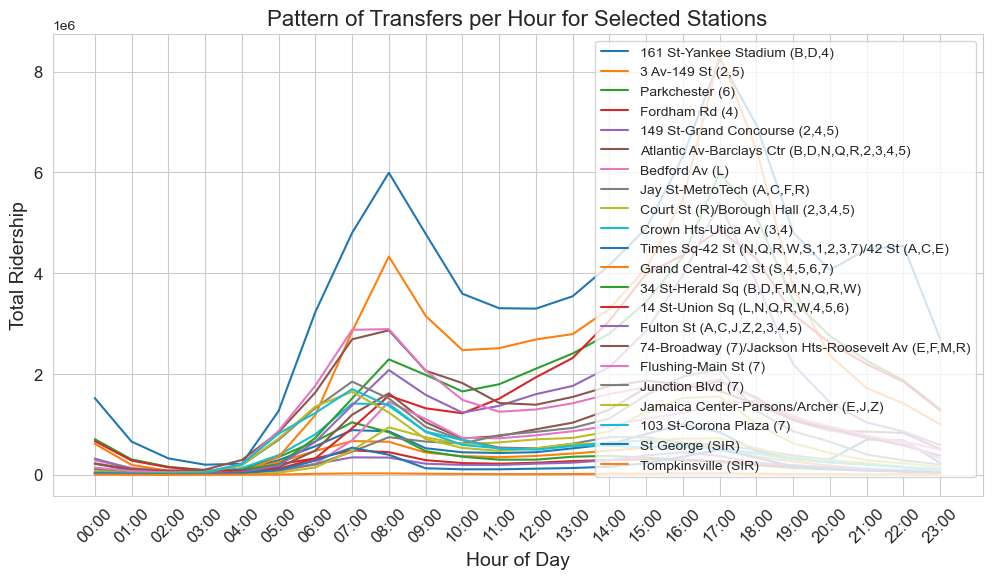

In [20]:
station_borough_transfers = df.groupby(['station_complex', 'borough'])['ridership'].sum().reset_index()

top_stations_by_borough = top_n_stations_by_borough(station_borough_transfers)

# extract the station complex names from the top stations DataFrame
selected_stations = top_stations_by_borough['station_complex'].unique()
selected_df = df[df['station_complex'].isin(selected_stations)]

plt.figure(figsize=(12, 6))
for station in selected_stations:
    station_data = selected_df[selected_df['station_complex'] == station]
    hourly_transfers = station_data.groupby('hour')['ridership'].sum()
    hourly_transfers.plot(label=station)

plt.xlabel('Hour of Day', fontsize=14)
plt.ylabel('Total Ridership', fontsize=14)
plt.title('Pattern of Ridership per Hour for Selected Stations', fontsize=16)
plt.xticks(range(24), labels=[f'{h:02}:00' for h in range(24)], rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=10)
plt.grid(True)
plt.show()

## Ridership / Transfers Breakdown

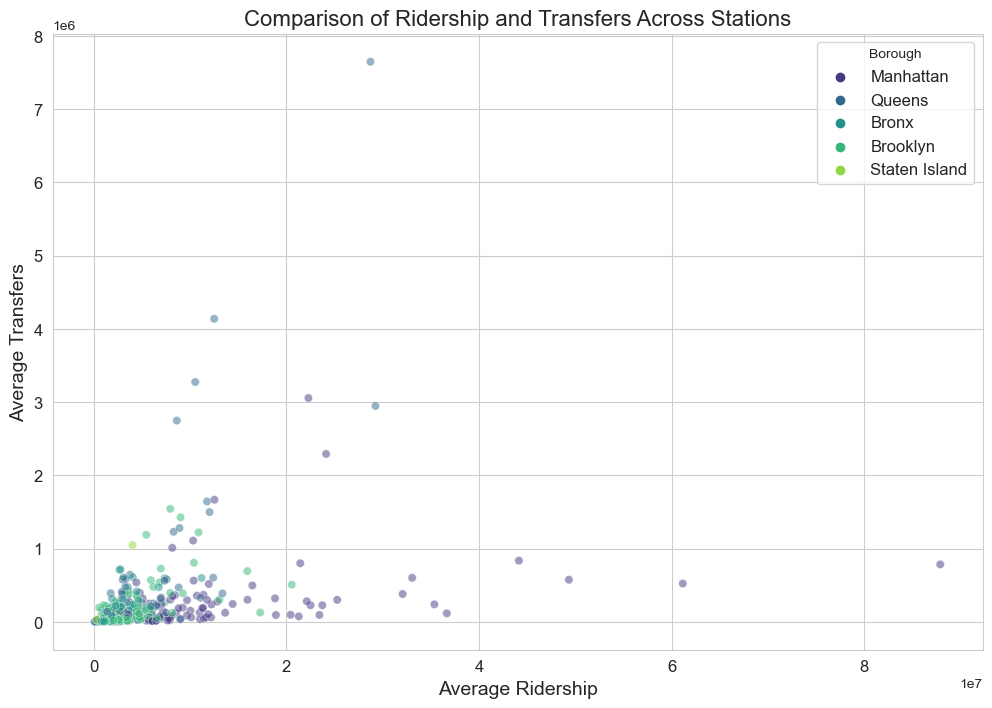

In [15]:
# group by station complex and calculate average ridership and transfers
station_stats = df.groupby(['station_complex', 'borough']).agg({'ridership': 'sum', 'transfers': 'sum'}).reset_index()

plt.figure(figsize=(12, 8))
sns.scatterplot(x='ridership', y='transfers', hue='borough', data=station_stats, alpha=0.5, palette='viridis')
plt.xlabel('Average Ridership', fontsize=14)
plt.ylabel('Average Transfers', fontsize=14)
plt.title('Comparison of Ridership and Transfers Across Stations', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='Borough', fontsize=12)
plt.show()

- **Plot Summary**: Displays station-level ridership vs. transfers, color-coded by borough.
- **Key Observation**: Manhattan stations show higher ridership and transfers.
- **Data Cluster**: Many stations, particularly outside Manhattan, have low transfers and ridership.
- **Outliers**: Some stations exhibit exceptionally high values; warrant further investigation.

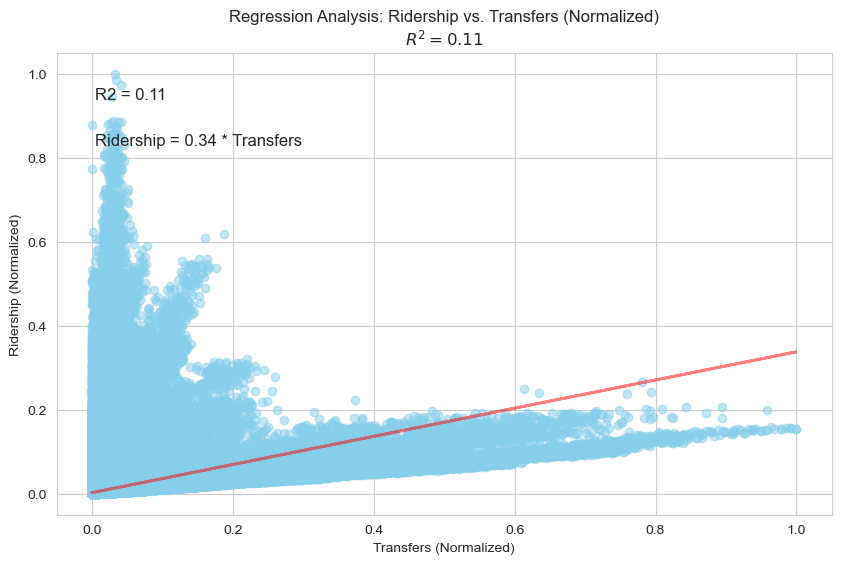

In [29]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

from sklearn.preprocessing import MinMaxScaler
X = df[['transfers']]
y = df['ridership']

scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

X_scaled = scaler_X.fit_transform(X)
y_scaled = scaler_y.fit_transform(y.values.reshape(-1, 1))

model = LinearRegression()
model.fit(X_scaled, y_scaled)

r2 = r2_score(y_scaled, model.predict(X_scaled))

plt.figure(figsize=(10, 6))
plt.scatter(X_scaled, y_scaled, color='skyblue', alpha=0.5)  # Adjust alpha for transparency
plt.plot(X_scaled, model.predict(X_scaled), color='red', linewidth=2, alpha=0.5)  # Adjust alpha for transparency
plt.xlabel('Transfers (Normalized)')
plt.ylabel('Ridership (Normalized)')
plt.title('Regression Analysis: Ridership vs. Transfers (Normalized)\n$R^2 = {:.2f}$'.format(r2))
plt.annotate('R2 = {:.2f}'.format(r2), xy=(0.05, 0.9), xycoords='axes fraction', fontsize=12)
plt.annotate('Ridership = {:.2f} * Transfers'.format(model.coef_[0][0]), xy=(0.05, 0.8), xycoords='axes fraction', fontsize=12)
plt.show()

#### Comments:
- Both `Ridership` and `Transfers` have been normalized to a [0, 1] range. This standardizes scale for model input.
- **Equation**: `Ridership = 0.34 * Transfers` indicates a moderate relationship.
- **R²**: At 0.11, the model explains only a small portion of the variance.


#### Interpretation

The regression equation from our scatter plot analysis is:

$$
\text{Ridership} = 0.34 \times \text{Transfers}
$$

This equation indicates that on a normalized scale, where both ridership and transfers are scaled between 0 and 1, for each unit increase in transfers, the ridership increases by 0.34 units.

However, to understand how many transfers would equate to one full unit of ridership, we can rearrange the equation:

$$
\text{Ridership} = 1 = 0.34 \times \text{Transfers}
$$

Solving for Transfers gives us:

$$
\text{Transfers} = \frac{1}{0.34}
$$

After calculating this, we find that approximately 2.94 transfers are equivalent to one unit of normalized ridership. This means that in our normalized scale, an increase of 2.94 in transfers would, on average, be associated with an increase of one unit in ridership.


# Compute Average Daily Ridership

In [30]:
df_agg_riders = df.groupby(["station_complex_id", "borough"]).agg({"ridership":"sum", "transit_timestamp": lambda x: x.dt.date.nunique()})
df_agg_riders = df_agg_riders.rename(columns={"transit_timestamp":"num_days"})

In [31]:
df_agg_riders.num_days.value_counts()

num_days
795    354
794     23
793     13
792      9
790      7
789      4
783      2
784      2
782      2
791      2
773      1
738      1
769      1
788      1
765      1
752      1
786      1
713      1
785      1
776      1
Name: count, dtype: int64

In [32]:
df_agg_riders

,,ridership,num_days
station_complex_id,borough,,
1,Queens,6961702,795
10,Manhattan,11449844,795
100,Brooklyn,1300232,795
101,Brooklyn,5954345,795
103,Manhattan,1815464,790
...,...,...,...
97,Brooklyn,5345513,795
98,Brooklyn,3403804,795
99,Brooklyn,1878846,795


**This suggests missing values!**

The number of predefined days was 795. Minimum, for each day, 1 value is missing, maximum 24. 

- Average Daily Ridership Calculation:

In [33]:
df_agg_riders["avg_daily_ridership"] = df_agg_riders["ridership"] / df_agg_riders["num_days"]

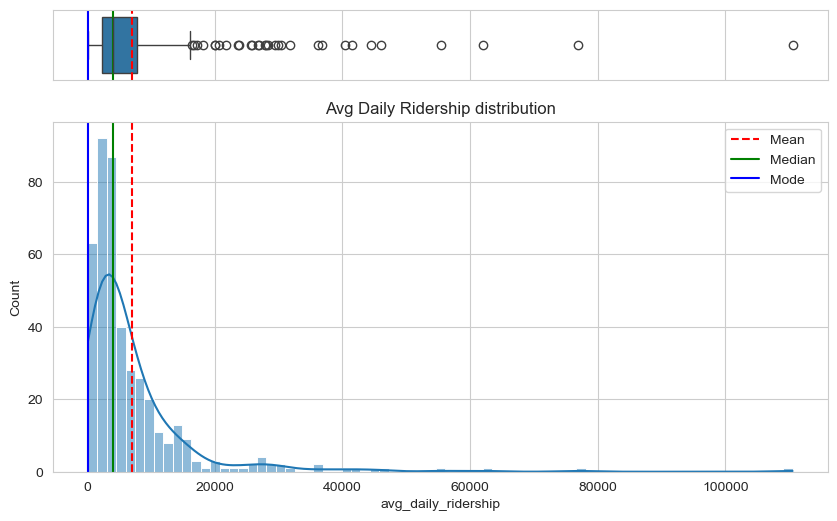

In [34]:
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.2, 1)}, figsize=(10,6))   

mean = df_agg_riders["avg_daily_ridership"].mean()
median = df_agg_riders["avg_daily_ridership"].median()
mode = df_agg_riders["avg_daily_ridership"].mode().values[0]

sns.boxplot(data=df_agg_riders, x="avg_daily_ridership", ax=ax_box)
ax_box.axvline(mean, color='r', linestyle='--')
ax_box.axvline(median, color='g', linestyle='-')
ax_box.axvline(mode, color='b', linestyle='-')

sns.histplot(data=df_agg_riders, x="avg_daily_ridership", ax=ax_hist, kde=True)
ax_hist.axvline(mean, color='r', linestyle='--', label="Mean")
ax_hist.axvline(median, color='g', linestyle='-', label="Median")
ax_hist.axvline(mode, color='b', linestyle='-', label="Mode")

ax_hist.legend()

ax_box.set(xlabel='')
plt.title("Avg Daily Ridership distribution")
plt.show()

In [35]:
df_agg_riders.sort_values(by=["avg_daily_ridership"], ascending=False)

,,ridership,num_days,avg_daily_ridership
station_complex_id,borough,,,
611,Manhattan,87868192,795,110526.027673
610,Manhattan,61148278,795,76916.072956
607,Manhattan,49327155,795,62046.735849
602,Manhattan,44140162,795,55522.216352
628,Manhattan,36659382,795,46112.430189
...,...,...,...,...
206,Queens,305957,789,387.778200
502,Staten Island,301350,794,379.534005
201,Queens,211610,795,266.176101


In [36]:
df[df["station_complex_id"].isin(["611", "610", "607", "602"])]["station_complex"].unique()

array(['14 St-Union Sq (L,N,Q,R,W,4,5,6)',
       '34 St-Herald Sq (B,D,F,M,N,Q,R,W)',
       'Grand Central-42 St (S,4,5,6,7)',
       'Times Sq-42 St (N,Q,R,W,S,1,2,3,7)/42 St (A,C,E)'], dtype=object)

In [37]:
df_agg_riders.sort_values(by=["avg_daily_ridership"], ascending=True)

,,ridership,num_days,avg_daily_ridership
station_complex_id,borough,,,
199,Queens,125959,794,158.638539
202,Queens,133655,793,168.543506
201,Queens,211610,795,266.176101
502,Staten Island,301350,794,379.534005
206,Queens,305957,789,387.778200
...,...,...,...,...
628,Manhattan,36659382,795,46112.430189
602,Manhattan,44140162,795,55522.216352
607,Manhattan,49327155,795,62046.735849


In [38]:
df[df["station_complex_id"].isin(["199", "202", "201", "502"])]["station_complex"].unique()

array(['Tompkinsville (SIR)', 'Broad Channel (A,S)', 'Beach 105 St (A,S)',
       'Beach 98 St (A,S)'], dtype=object)

**Makes sense: this aggregated dataset should have 428 stations as in the exploration made above.**

In [39]:
df_agg_riders["avg_daily_ridership"].describe()

count       428.000000
mean       7109.126036
std        9904.209897
min         158.638539
25%        2319.989441
50%        4044.251572
75%        7868.812893
max      110526.027673
Name: avg_daily_ridership, dtype: float64

The four quantiles are:

- 1st quantile: `[158.63, 2319.98[`
- 2nd quantile: `[2319.98, 4044.25[`
- 3rd quantile: `[4044.25, 7868.81[`
- 4th percentile: `[7868.81, 110526.02]`


In [40]:
def add_quantile_column(df, column_name):
    # calculate quantiles
    quantiles = df[column_name].quantile([0.25, 0.5, 0.75])

    # add column based on quantiles
    df['quantile'] = pd.cut(df[column_name], bins=[-float("inf"),
                                                   quantiles.iloc[0],
                                                   quantiles.iloc[1],
                                                   quantiles.iloc[2],
                                                   float("inf")], labels=['1st percentile',
                                                                          '2nd percentile',
                                                                          '3rd percentile',
                                                                          '4th percentile'])
    return df

In [41]:
df_quant = add_quantile_column(df_agg_riders, 'avg_daily_ridership').reset_index()

In [42]:
df_quant

,station_complex_id,borough,ridership,num_days,avg_daily_ridership,quantile
0,1,Queens,6961702,795,8756.857862,4th percentile
1,10,Manhattan,11449844,795,14402.319497,4th percentile
2,100,Brooklyn,1300232,795,1635.511950,1st percentile
3,101,Brooklyn,5954345,795,7489.742138,3rd percentile
4,103,Manhattan,1815464,790,2298.055696,1st percentile
...,...,...,...,...,...,...
423,97,Brooklyn,5345513,795,6723.915723,3rd percentile
424,98,Brooklyn,3403804,795,4281.514465,3rd percentile
425,99,Brooklyn,1878846,795,2363.328302,2nd percentile
426,TRAM1,Manhattan,3026446,795,3806.850314,2nd percentile


In order to choose stations, the idea was to choose stations that:
- Are not close to the interval bounds

So I choose the stations that are closer to the **median**.

In [43]:
# tracking of selected stations
selected_stations_global = {'Manhattan': [], 'Brooklyn': [], 'Queens': [], 'Bronx': []}

def select_stations(df, quantile, global_borough_count):
    df_tmp = df[df["quantile"] == quantile]
    median = df_tmp['avg_daily_ridership'].median()
    df_tmp['difference'] = abs(df_tmp['avg_daily_ridership'] - median)
    
    sorted_df = df_tmp.sort_values(by='difference')
    selected = []
    
    # get the least represented boroughs globally
    least_rep_boroughs = sorted(global_borough_count, key=lambda x: len(global_borough_count[x]))
    
    # try to select stations from underrepresented boroughs first
    for borough in least_rep_boroughs:
        borough_df = sorted_df[sorted_df['borough'] == borough]
        if not borough_df.empty:
            station_id = borough_df.iloc[0]['station_complex_id']
            selected.append(station_id)
            global_borough_count[borough].append(station_id)
            if len(selected) >= 2:
                break

    # if necessary, fill remaining slots with other available stations
    if len(selected) < 2:
        remaining_stations = sorted_df[~sorted_df['station_complex_id'].isin(selected)]
        for _, row in remaining_stations.iterrows():
            if row['station_complex_id'] not in selected:
                selected.append(row['station_complex_id'])
                global_borough_count[row['borough']].append(row['station_complex_id'])
            if len(selected) >= 2:
                break

    return selected

# select stations for each quantile
for pct in df_quant["quantile"].unique():
    stations = select_stations(df_quant, pct, selected_stations_global)
    print(f"{pct} station_complex_ids: {stations}")

# final check for borough coverage
all_boroughs = {'Manhattan', 'Brooklyn', 'Queens', 'Bronx'}
selected_boroughs = set(b for b, stations in selected_stations_global.items() if stations)
if all_boroughs == selected_boroughs:
    print("All boroughs are covered in the final selection.")
else:
    print("Boroughs not adequately represented:", all_boroughs - selected_boroughs)


4th percentile station_complex_ids: ['392', '630']
1st percentile station_complex_ids: ['82', '445']
3rd percentile station_complex_ids: ['304', '41']
2nd percentile station_complex_ids: ['109', '380']
All boroughs are covered in the final selection.


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/2779658276.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tmp['difference'] = abs(df_tmp['avg_daily_ridership'] - median)
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/2779658276.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tmp['difference'] = abs(df_tmp['avg_daily_ridership'] - median)
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/2779658276.py:7: SettingWithCopyWarning: 
A value is tryi

##### Station Selection Algorithm Overview

This algorithm selects subway stations from a dataset grouped into quantiles based on ridership. The primary goal is to ensure that all boroughs are fairly represented across these quantiles.

**Key Steps in the Algorithm**

**Step 1: Initialization**

Initialize a dictionary to track the selected stations by borough, ensuring representation is monitored and balanced.

```python
selected_stations_global = {'Manhattan': [], 'Brooklyn': [], 'Queens': [], 'Bronx': []}
```

**Step 2: Define the Station Selection Function**

Create a function select_stations that processes each quantile:

Filter and Sort: Stations are filtered by quantile and sorted by their closeness to the median ridership.
Borough Priority: Selection prioritizes boroughs with fewer selections to balance representation.
Complete the Selection: If fewer than two stations are initially selected, additional stations are chosen without duplicating previous selections.

**Step 3: Iterative Selection**

Run a loop to apply select_stations for each quantile, updating the global tracker for borough representation.

**Step 4: Final Representation Check**

After all quantiles have been processed, ensure that all boroughs are represented:


In [44]:
station_list = ['392', '630', '82', '445', '304', '41', '109', '380']

# Forecasting

In [45]:
df_model = df[df["station_complex_id"].isin(station_list)]

In [46]:
df_model.borough.value_counts()

borough
Manhattan    281899
Brooklyn     264189
Bronx        239905
Queens       228740
Name: count, dtype: int64

In [47]:
df_model.shape

(1014733, 17)

In [48]:
df_model.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1014733 entries, 1345037 to 54729766
Data columns (total 17 columns):
 #   Column               Non-Null Count    Dtype         
---  ------               --------------    -----         
 0   transit_timestamp    1014733 non-null  datetime64[ns]
 1   transit_mode         1014733 non-null  object        
 2   station_complex_id   1014733 non-null  object        
 3   station_complex      1014733 non-null  object        
 4   borough              1014733 non-null  object        
 5   payment_method       1014733 non-null  object        
 6   fare_class_category  1014733 non-null  object        
 7   ridership            1014733 non-null  int64         
 8   transfers            1014733 non-null  int64         
 9   latitude             1014733 non-null  float64       
 10  longitude            1014733 non-null  float64       
 11  Georeference         1014733 non-null  object        
 12  hour                 1014733 non-null  int32         


In [49]:
df_model_agg = df_model.groupby(["transit_timestamp",
                                 "transit_mode",
                                "station_complex_id",
                                "borough"]).agg({"ridership":"sum"}).reset_index()

In [50]:
df_model_agg.shape

(146589, 5)

In [51]:
df_model_agg

,transit_timestamp,transit_mode,station_complex_id,borough,ridership
0,2022-02-01 00:00:00,subway,109,Queens,9
1,2022-02-01 00:00:00,subway,304,Manhattan,12
2,2022-02-01 00:00:00,subway,380,Bronx,8
3,2022-02-01 00:00:00,subway,392,Manhattan,99
4,2022-02-01 00:00:00,subway,41,Brooklyn,17
...,...,...,...,...,...
146584,2024-04-05 23:00:00,subway,392,Manhattan,216
146585,2024-04-05 23:00:00,subway,41,Brooklyn,90
146586,2024-04-05 23:00:00,subway,445,Bronx,2
146587,2024-04-05 23:00:00,subway,630,Brooklyn,186


In [52]:
df_model_agg[["station_complex_id", "borough"]].value_counts()

station_complex_id  borough  
392                 Manhattan    19054
630                 Brooklyn     19054
380                 Bronx        19018
304                 Manhattan    18700
109                 Queens       18403
41                  Brooklyn     17681
445                 Bronx        17465
82                  Queens       17214
Name: count, dtype: int64

In [53]:
bad_stations = ["82", "445", "41", "109"]

In [54]:
df_model_agg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146589 entries, 0 to 146588
Data columns (total 5 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   transit_timestamp   146589 non-null  datetime64[ns]
 1   transit_mode        146589 non-null  object        
 2   station_complex_id  146589 non-null  object        
 3   borough             146589 non-null  object        
 4   ridership           146589 non-null  int64         
dtypes: datetime64[ns](1), int64(1), object(3)
memory usage: 5.6+ MB


In [55]:
df_model_agg.station_complex_id.value_counts()

station_complex_id
392    19054
630    19054
380    19018
304    18700
109    18403
41     17681
445    17465
82     17214
Name: count, dtype: int64

In [56]:
def preprocess_data(df):
    df.set_index('transit_timestamp', inplace=True)
    df_complete = df.resample('H').asfreq()
    df_complete['ridership'] = df_complete['ridership'].interpolate()
    df_complete['borough'] = df_complete['borough'].fillna(method='ffill')
    df_complete['transit_mode'] = df_complete['transit_mode'].fillna(method='ffill')
    df_complete = df_complete.drop(columns=["station_complex_id"])
    return df_complete

In [57]:
df_model_agg_final = df_model_agg.groupby(["station_complex_id"]).apply(preprocess_data).reset_index()

/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/211078480.py:5: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_complete['borough'] = df_complete['borough'].fillna(method='ffill')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/211078480.py:6: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_complete['transit_mode'] = df_complete['transit_mode'].fillna(method='ffill')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/211078480.py:5: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_complete['borough'] = df_complete['borough'].fillna(method='ffill')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/211078480.py:6: FutureWarning: Series.fillna with 'method' is de

In [58]:
df_model_agg_final.station_complex_id.value_counts()

station_complex_id
109    19080
304    19080
380    19080
392    19080
41     19080
445    19080
630    19080
82     19080
Name: count, dtype: int64

In [59]:
df_model_agg_final

,station_complex_id,transit_timestamp,transit_mode,borough,ridership
0,109,2022-02-01 00:00:00,subway,Queens,9.0
1,109,2022-02-01 01:00:00,subway,Queens,5.0
2,109,2022-02-01 02:00:00,subway,Queens,4.0
3,109,2022-02-01 03:00:00,subway,Queens,5.0
4,109,2022-02-01 04:00:00,subway,Queens,21.0
...,...,...,...,...,...
152635,82,2024-04-05 19:00:00,subway,Queens,50.0
152636,82,2024-04-05 20:00:00,subway,Queens,50.0
152637,82,2024-04-05 21:00:00,subway,Queens,29.0
152638,82,2024-04-05 22:00:00,subway,Queens,17.0


In [60]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder


class LinearPreprocessor(BaseEstimator, TransformerMixin):
    def __init__(self, numerical_features=None, categorical_features=None):
        self.numerical_features = numerical_features
        self.categorical_features = categorical_features
        self.ohe = OneHotEncoder(drop='first', sparse_output=False)
        self.categories_ = None  # Internal variable to store learned categories

    def fit(self, X, y=None):
        X = self._add_time_features(X)
        if self.categorical_features:
            self.ohe.fit(X[self.categorical_features])
            self.categories_ = self.ohe.categories_
        return self

    def transform(self, X):
        X = X.copy()
        X = self._add_time_features(X)

        X_num = X[self.numerical_features] if self.numerical_features else X.select_dtypes(include=[np.number])

        if self.categorical_features and self.categories_ is not None:
            self.ohe.categories_ = self.categories_  # Set learned categories
            X_cat = self.ohe.transform(X[self.categorical_features])
            cat_cols = self.ohe.get_feature_names_out(self.categorical_features)
            X_cat = pd.DataFrame(X_cat, columns=cat_cols, index=X.index)
            return pd.concat([X_num, X_cat], axis=1)

        return X_num

    def _add_time_features(self, X):
        X['hour'] = X['transit_timestamp'].dt.hour
        X['day_of_week'] = X['transit_timestamp'].dt.dayofweek
        X['month'] = X['transit_timestamp'].dt.month
        X['is_weekend'] = X['day_of_week'].isin([5, 6])
        return X


class LightGBMPreprocessor(BaseEstimator, TransformerMixin):
    def __init__(self, numerical_features=None, categorical_features=None):
        self.numerical_features = numerical_features
        self.categorical_features = categorical_features

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X = X.copy()
        
        X['hour'] = X['transit_timestamp'].dt.hour
        X['day_of_week'] = X['transit_timestamp'].dt.dayofweek
        X['month'] = X['transit_timestamp'].dt.month
        X['is_weekend'] = X['day_of_week'].isin([5, 6])

        if self.numerical_features:
            X_num = X[self.numerical_features]
        else:
            X_num = X.select_dtypes(include=[np.number])

        if self.categorical_features:
            X_cat = X[self.categorical_features]
            for col in self.categorical_features:
                X_cat[col] = X_cat[col].astype('category')
            X_final = pd.concat([X_num, X_cat], axis=1)
            return X_final

        return X_num

class ProphetWrapper(BaseEstimator, TransformerMixin):
    def __init__(self, daily_seasonality=True, weekly_seasonality=True):
        self.daily_seasonality = daily_seasonality
        self.weekly_seasonality = weekly_seasonality
        self.model = None

    def fit(self, X, y):
        df = pd.DataFrame({
            'ds': X['transit_timestamp'],
            'y': y
        })
        self.model = Prophet(daily_seasonality=self.daily_seasonality, weekly_seasonality=self.weekly_seasonality)
        self.model.fit(df)
        return self

    def predict(self, X):
        future = pd.DataFrame({
            'ds': X['transit_timestamp']
        })
        forecast = self.model.predict(future)
        return forecast['yhat']

In [24]:
# Pipeline for each model
linear_regression_pipeline = Pipeline([
    ('preprocessor', LinearPreprocessor(numerical_features=['hour',
                                                            'day_of_week',
                                                            'month',
                                                            'is_weekend'],
                                        categorical_features=["borough"])),
    ('regressor', LinearRegression())
])

lightgbm_pipeline = Pipeline([
    ('preprocessor', LightGBMPreprocessor(numerical_features=['hour',
                                                              'day_of_week',
                                                              'month',
                                                              'is_weekend'],
                                          categorical_features=['station_complex_id',
                                                                'borough'])),
    ('regressor', LGBMRegressor(verbose=-1))
])

prophet_pipeline = Pipeline([
    ('prophet', ProphetWrapper(daily_seasonality=True, weekly_seasonality=True))
])


In [80]:
def process_train_test(models, df, forecast_start):
    # Use all data before the forecast start for training
    train_data = df[df['transit_timestamp'] < forecast_start]
    test_data = df[(df['transit_timestamp'] >= forecast_start) & 
                   (df['transit_timestamp'] < forecast_start + pd.Timedelta(weeks=2))]
    
    results = {}

    for station_id, station_df in test_data.groupby('station_complex_id'):
        print(f"Station ID: {station_id}")
        plt.figure(figsize=(14, 5))
        plot_train_data = train_data[train_data["station_complex_id"] == station_id]
        plot_train_data = plot_train_data[plot_train_data['transit_timestamp'] >= forecast_start - pd.Timedelta(days=15)]
        combined_station_df = pd.concat([plot_train_data, station_df])

        plt.plot(combined_station_df.transit_timestamp, combined_station_df.ridership, label='Actual Ridership')
        plt.axvline(x=forecast_start, color='red', linestyle='--', linewidth=2, label='Start of Forecast')

        station_train_results = {}
        station_test_results = {}

        for model_name, model in models.items():
            if 'prophet' in model_name:
                model.fit(train_data[['transit_timestamp', 'ridership']], train_data['ridership'])
                y_pred_train = model.predict(plot_train_data[['transit_timestamp', 'ridership']])
                y_pred_test = model.predict(station_df[['transit_timestamp', 'ridership']])
            else:
                preprocessor = model.named_steps['preprocessor']
                regressor = model.named_steps['regressor']
                
                X_train, y_train = preprocessor.transform(train_data), train_data['ridership']
                regressor.fit(X_train, y_train)
                
                X_plot_train, y_plot_train = preprocessor.transform(plot_train_data), plot_train_data['ridership']
                X_test, y_test = preprocessor.transform(station_df), station_df['ridership']
                
                y_pred_train = regressor.predict(X_plot_train)
                y_pred_test = regressor.predict(X_test)

            mape_train = mean_absolute_percentage_error(y_plot_train, y_pred_train)
            rmse_train = root_mean_squared_error(y_plot_train, y_pred_train)
            rmse_test = root_mean_squared_error(y_test, y_pred_test)
            mape_test = mean_absolute_percentage_error(y_test, y_pred_test)

            station_train_results[model_name + '_train_mape'] = mape_train
            station_train_results[model_name + '_train_rmse'] = rmse_train
            station_test_results[model_name + '_test_mape'] = mape_test
            station_train_results[model_name + '_test_rmse'] = rmse_test

            plt.plot(plot_train_data.transit_timestamp, y_pred_train, label=f'{model_name} Train Prediction', linestyle=':')
            plt.plot(station_df.transit_timestamp, y_pred_test, label=f'{model_name} Test Prediction', linestyle='--')

        plt.legend()
        plt.savefig("./images/" + str(forecast_start.date()) + "_" +  str(station_id))

        plt.show()

        results[station_id] = {
            'train_results': station_train_results, 
            'test_results': station_test_results, 
            'num_training_points': len(plot_train_data)
        }

    return results

Station ID: 109


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

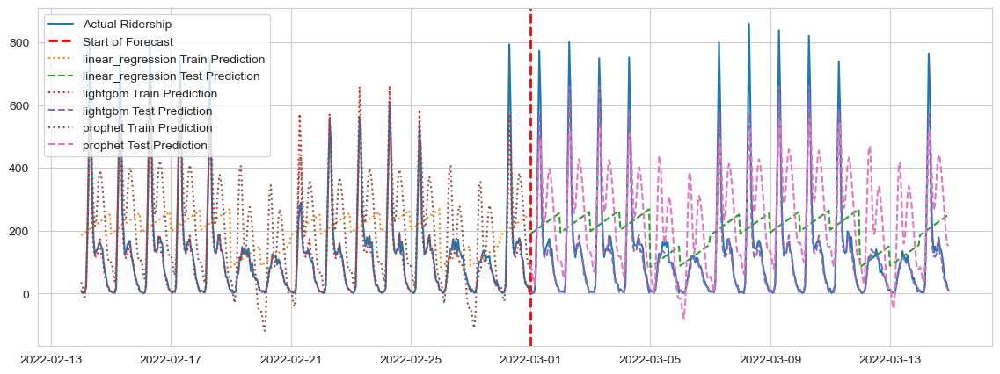

Station ID: 304


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

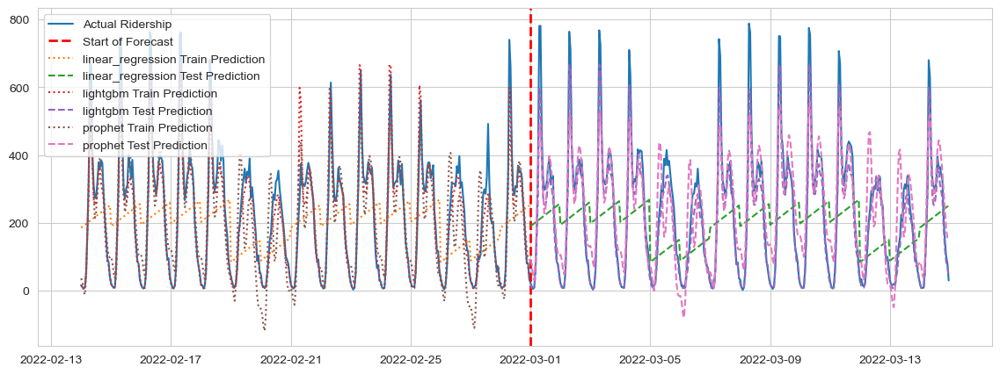

Station ID: 380


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

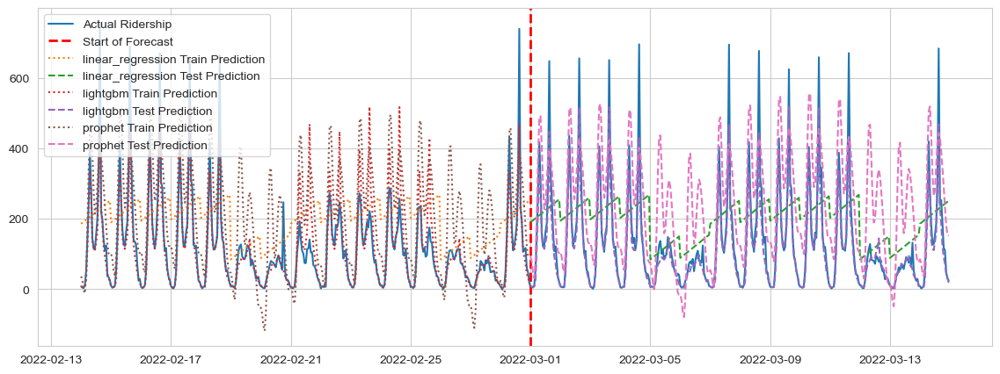

Station ID: 392


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

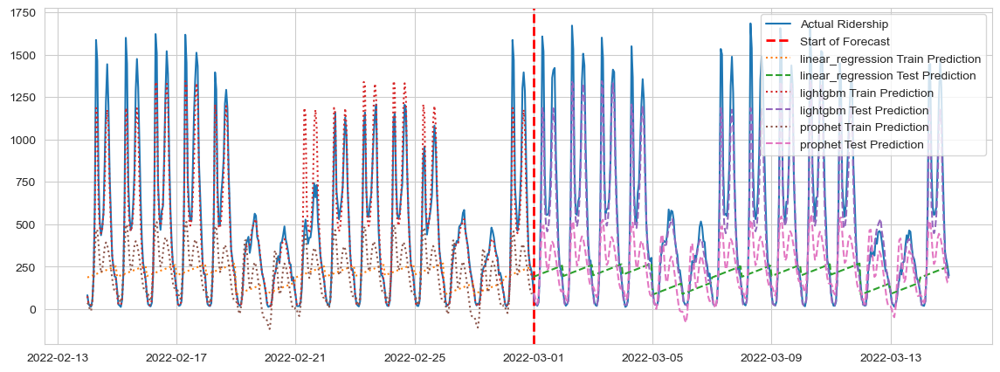

Station ID: 41


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

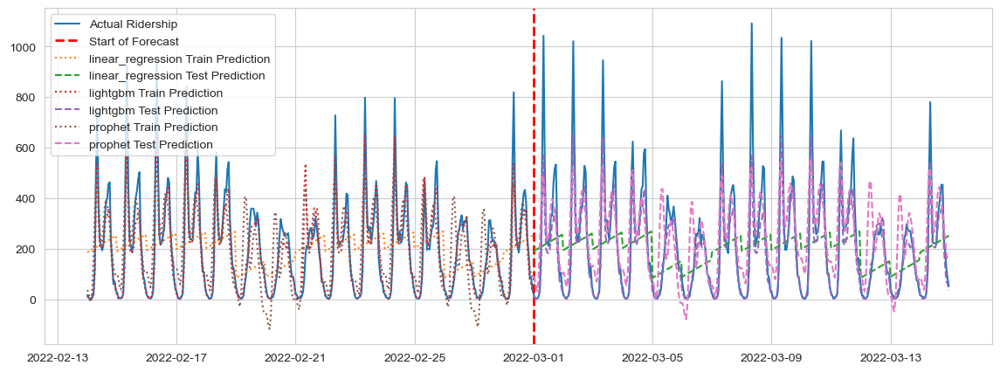

Station ID: 445


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

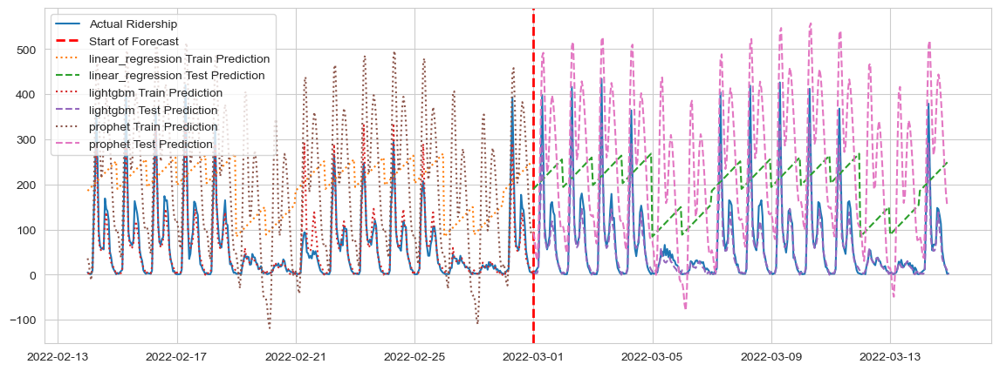

Station ID: 630


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

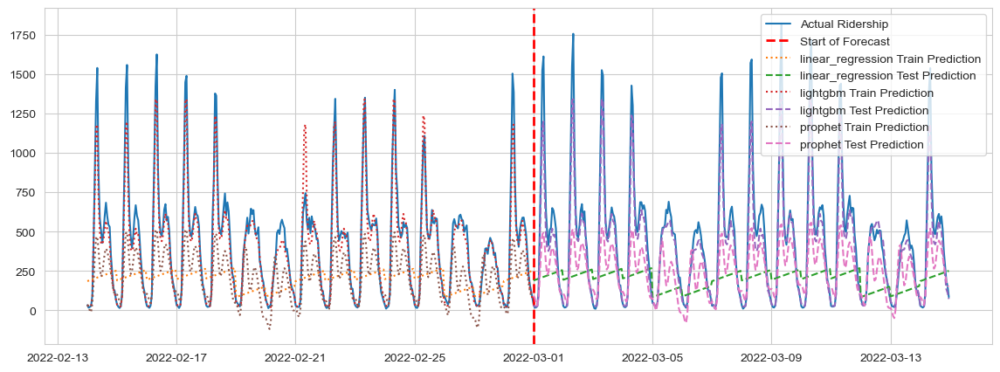

Station ID: 82


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

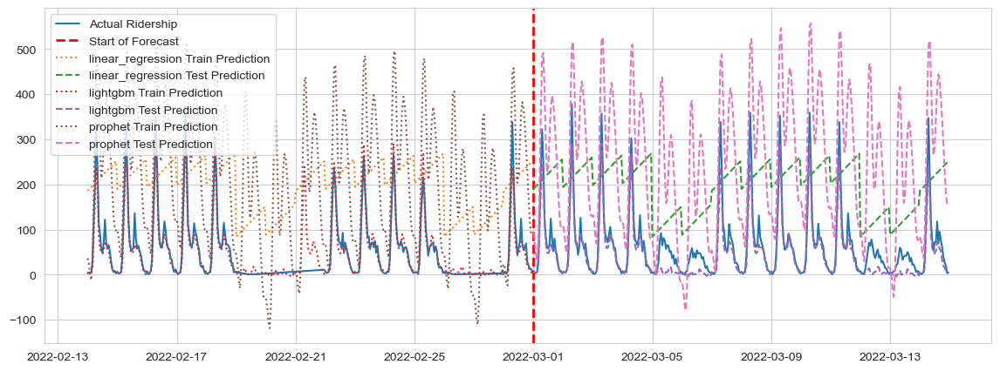

Station ID: 109


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

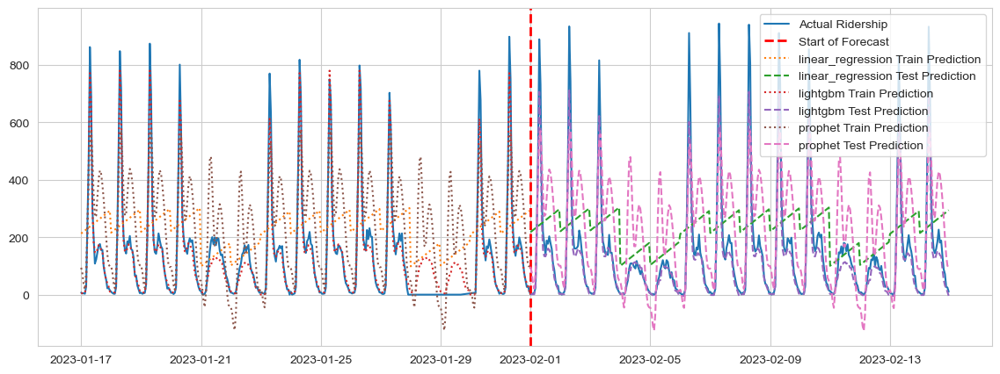

Station ID: 304


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

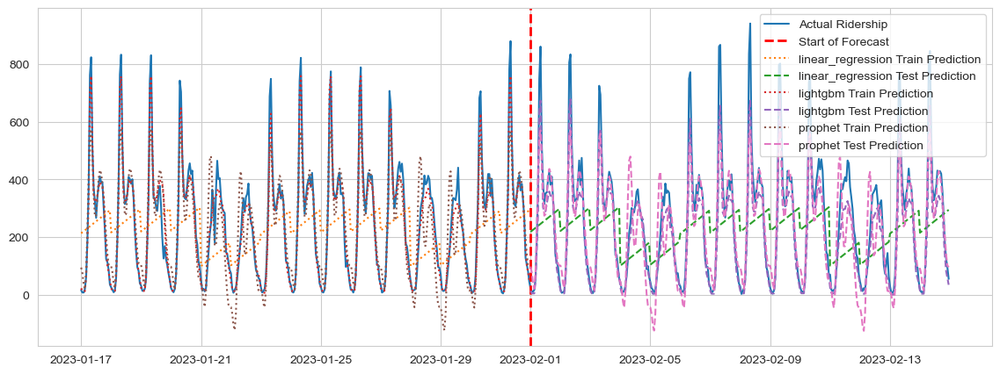

Station ID: 380


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

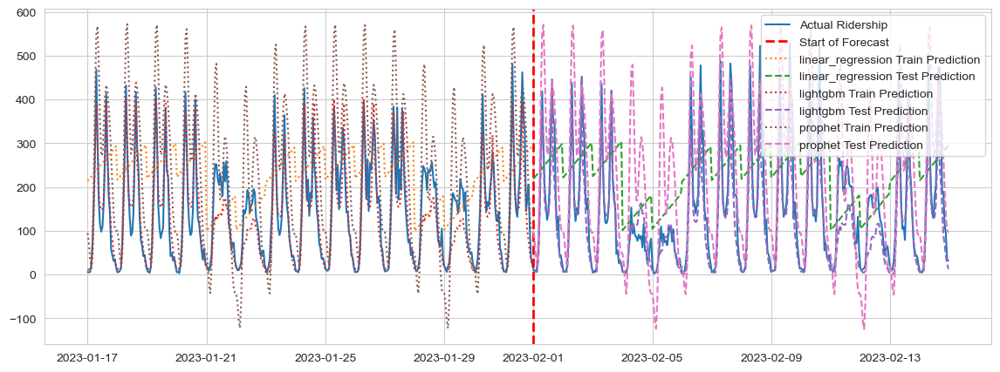

Station ID: 392


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

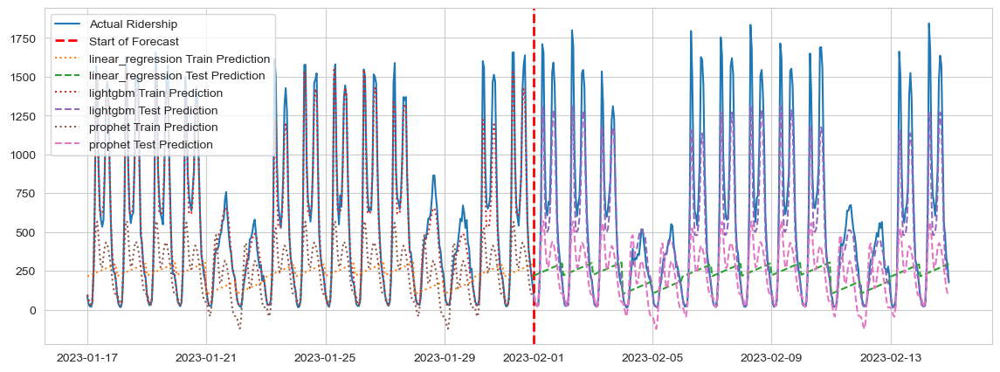

Station ID: 41


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

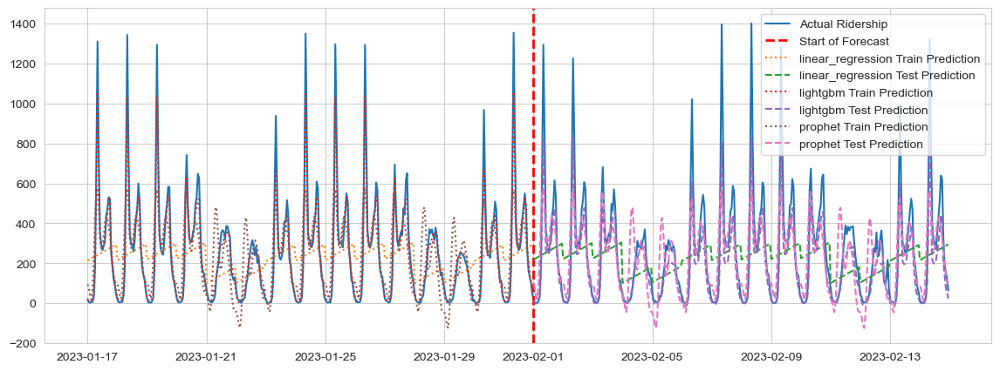

Station ID: 445


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

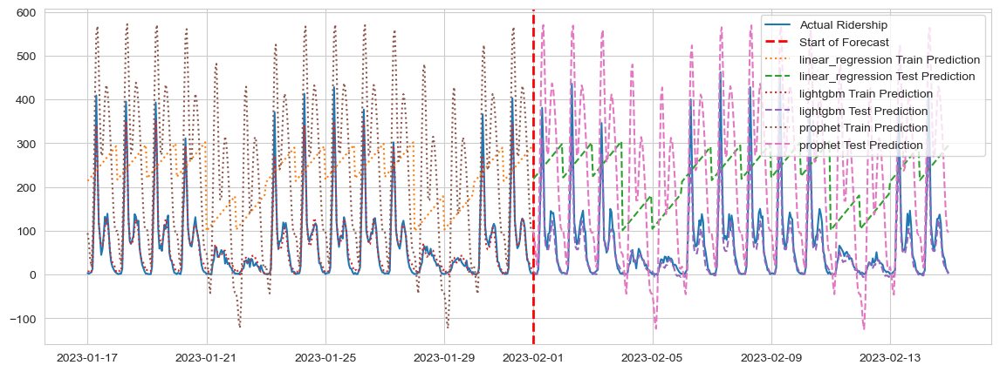

Station ID: 630


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

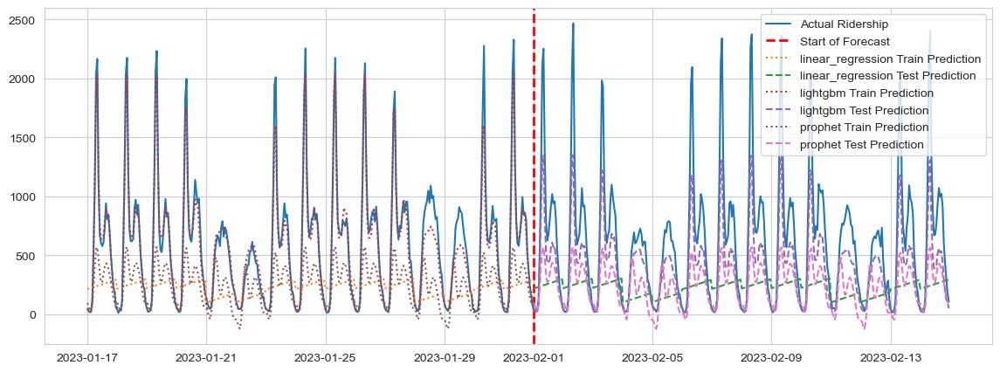

Station ID: 82


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

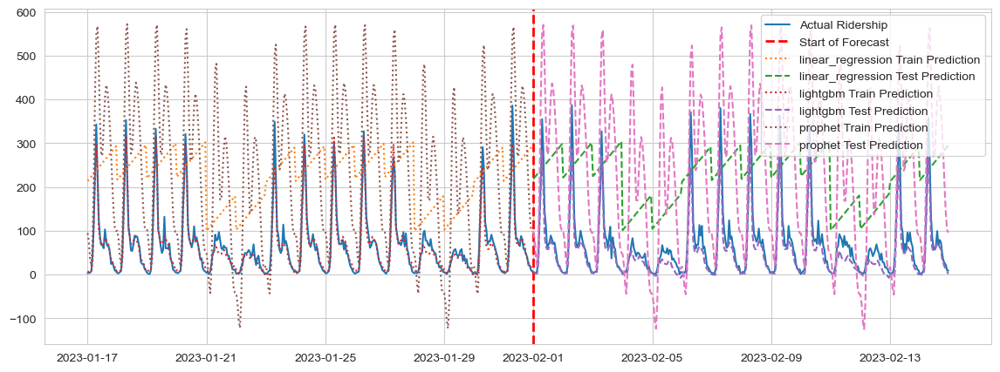

Station ID: 109


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

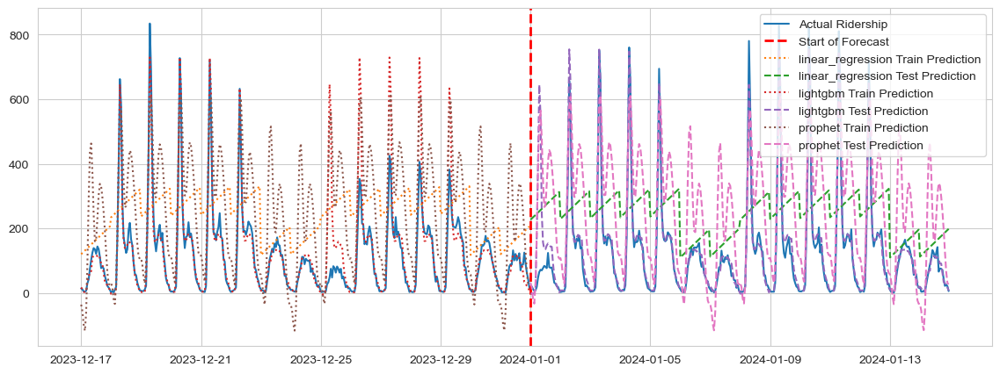

Station ID: 304


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

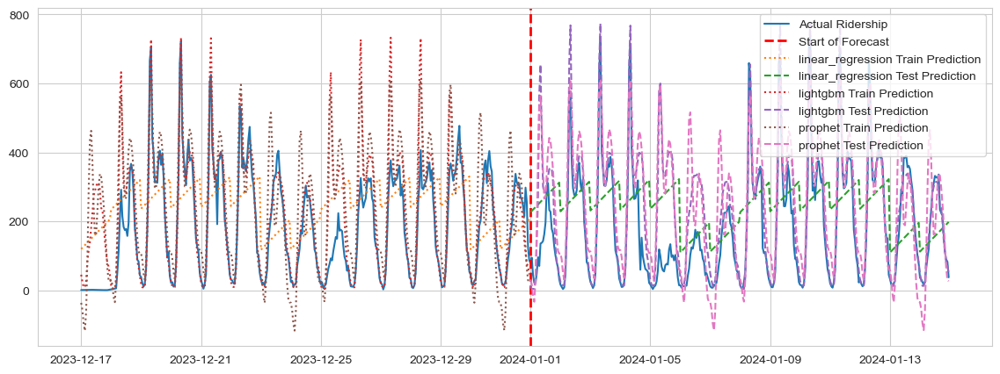

Station ID: 380


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

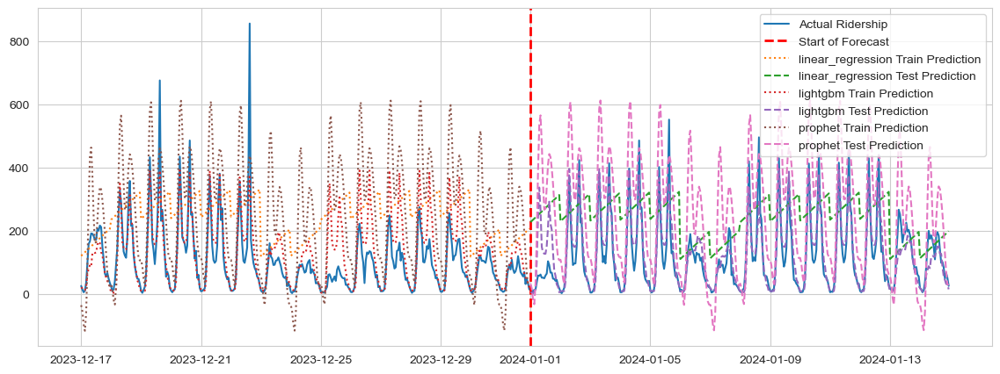

Station ID: 392


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

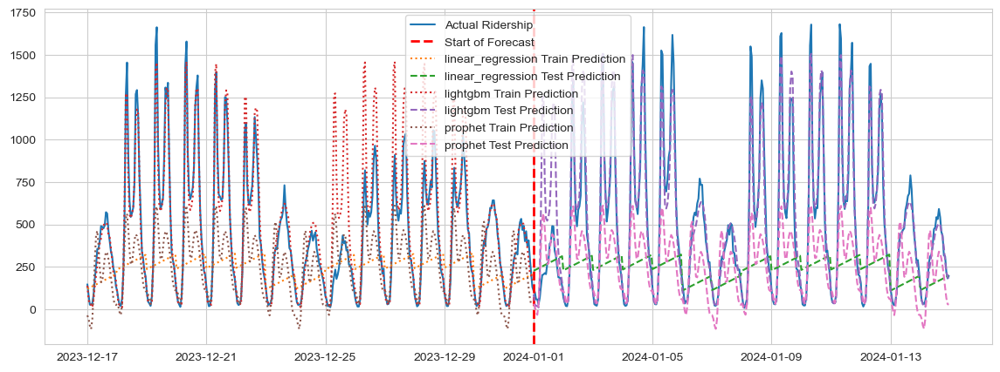

Station ID: 41


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

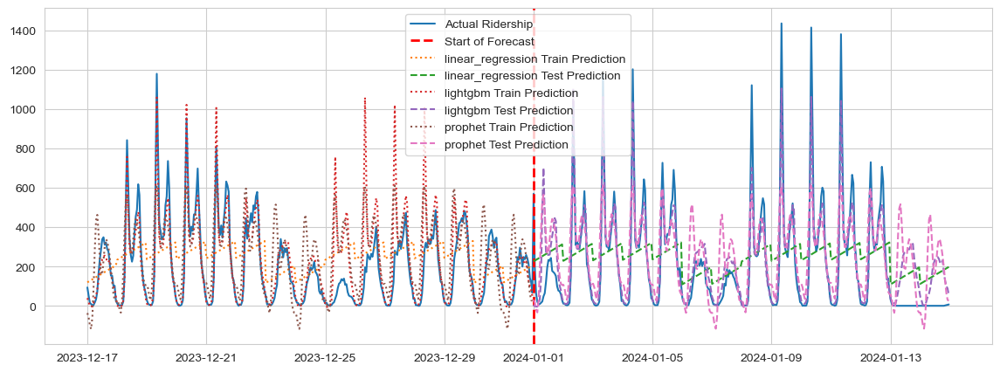

Station ID: 445


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

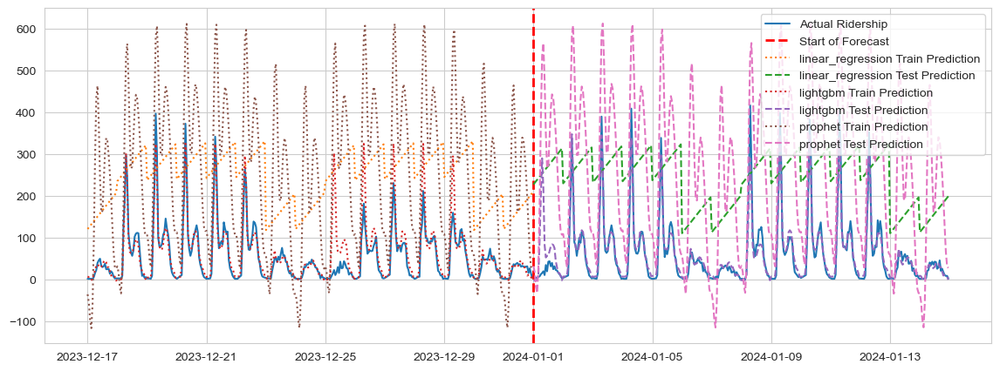

Station ID: 630


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

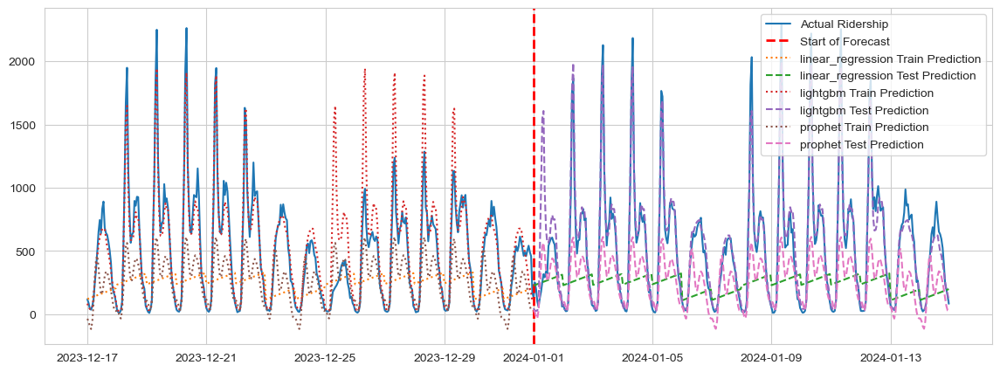

Station ID: 82


/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_cat[col] = X_cat[col].astype('category')
/var/folders/0g/wv7t2z9n13s3fzrmmrm2bqbr0000gp/T/ipykernel_27161/106301133.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

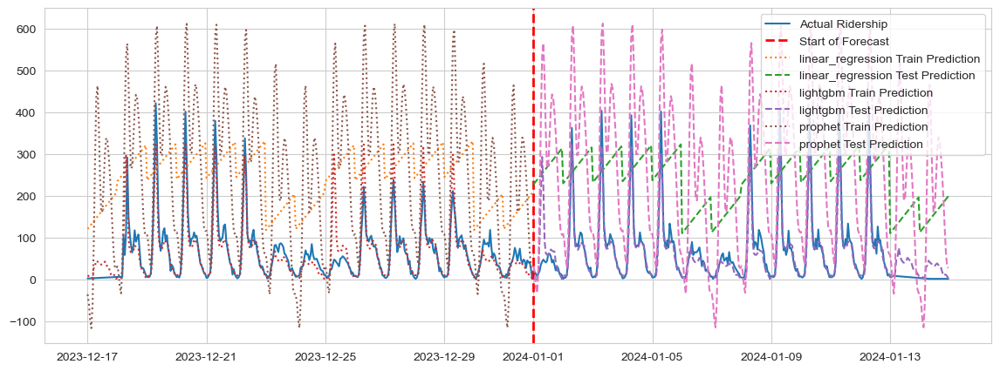

In [81]:
models = {
    'linear_regression': linear_regression_pipeline,
    'lightgbm': lightgbm_pipeline,
    'prophet': prophet_pipeline
}

# Run evaluations
results_all = {}
for start_date in ['2022-03-01', '2023-02-01', '2024-01-01']:
    start_dt = pd.to_datetime(start_date)
    start_results = process_train_test(models, df_model_agg_final, start_dt)
    results_all[start_date] = start_results

#### Result Analysis

1. Results on Historical Data:
- Linear Regression seems to have a consistent but rigid fit to the historical data.
- LightGBM has a more flexible fit, capturing peaks and troughs more closely, reflecting its capability to model complex nonlinear relationships in the data.
- Prophet's fit indicates that it is capturing the overall trend and some periodicity in the data, which is expected given its design to handle time series data with inherent seasonality, but its not capable to predict accurately when traffic patterns change.

2. Forecasting Performance:
- The forecast by Linear Regression does not seem to capture the variability in the ridership data well.
- LightGBM's predictions show a closer match to the actual data's volatility, suggesting that it is better at variations in patterns that influence ridership.
- Prophet's forecast appears to anticipate the trend reasonably well but may miss some of the more abrupt changes or finer details in the data pattern.

3. Predictive Accuracy:
- The accuracy of the predictions can be gauged by how closely the test predictions follow the actual data. LightGBM seems to provide the closest match, while Linear Regression and Prophet are more error prone.

4. Model Strengths and Weaknesses:
- The strength of LightGBM is its ability to handle complex patterns with more efficacy, which seems to make it the best performer for this particular dataset.
- Linear Regression, while generally less accurate in this context, may still provide a good baseline model due to its simplicity and interpretability.
- Prophet's strength lies in capturing trends and seasonality, which can be particularly useful for time series with strong periodic patterns but not, as in this case, abrupt variations.

In [48]:
data = []
for date, stations in results_all.items():
    for station_id, metrics in stations.items():
        row = {
            'starting_date': date,
            'station_complex_id': station_id,
            'num_training_points': metrics['num_training_points'],
            **{k: v for result_type in ['train_results', 'test_results'] for k, v in metrics[result_type].items()}
        }
        data.append(row)

# Create the DataFrame
df_results = pd.DataFrame(data)

In [49]:
df_results.head()

,starting_date,station_complex_id,num_training_points,linear_regression_train_mape,linear_regression_train_rmse,linear_regression_test_rmse,lightgbm_train_mape,lightgbm_train_rmse,lightgbm_test_rmse,prophet_train_mape,prophet_train_rmse,prophet_test_rmse,linear_regression_test_mape,lightgbm_test_mape,prophet_test_mape
0,2022-03-01,109,360,11.033421,167.071992,182.009226,0.236207,37.703699,44.282558,3.808928,131.141129,161.942223,10.081405,0.260425,4.916742
1,2022-03-01,304,360,3.261422,170.002353,185.812893,0.144461,44.535222,45.002140,1.015581,85.118982,91.972943,3.339533,0.164849,1.369709
2,2022-03-01,380,360,7.266437,140.860229,144.993310,0.281925,56.343201,44.323251,2.867416,133.279515,149.548145,6.721840,0.217148,3.583479
3,2022-03-01,392,360,1.521573,472.487569,545.265976,0.145442,112.221146,116.324018,0.755596,391.157184,438.355648,1.382527,0.145332,0.738174
4,2022-03-01,41,360,9.714673,174.166738,203.648091,0.314902,62.287368,85.212192,3.197225,121.929889,139.753814,8.572441,0.289052,3.948415


### RMSE Anslysis

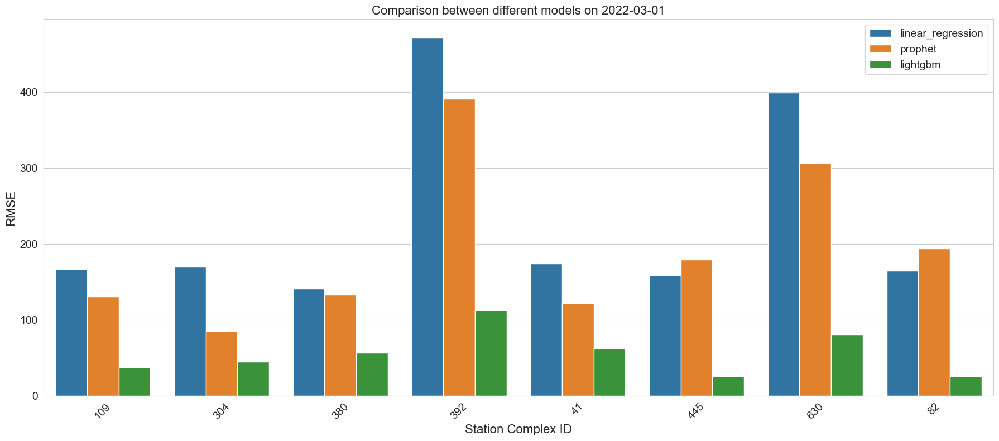

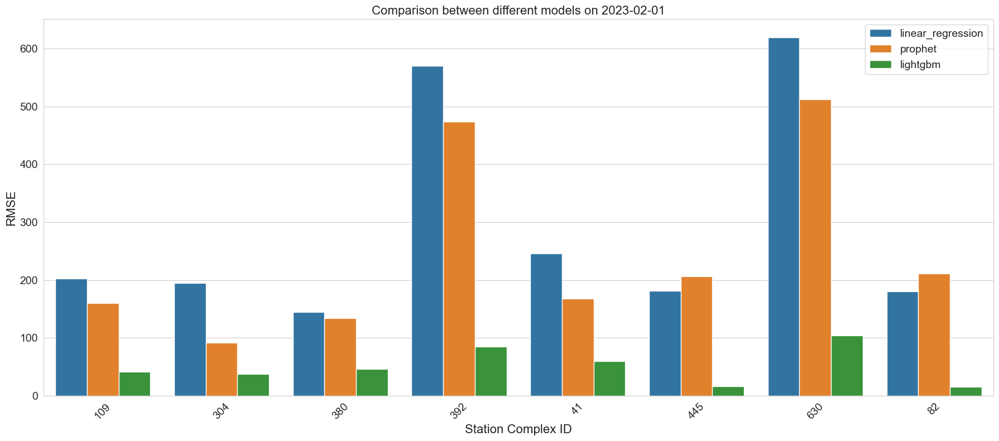

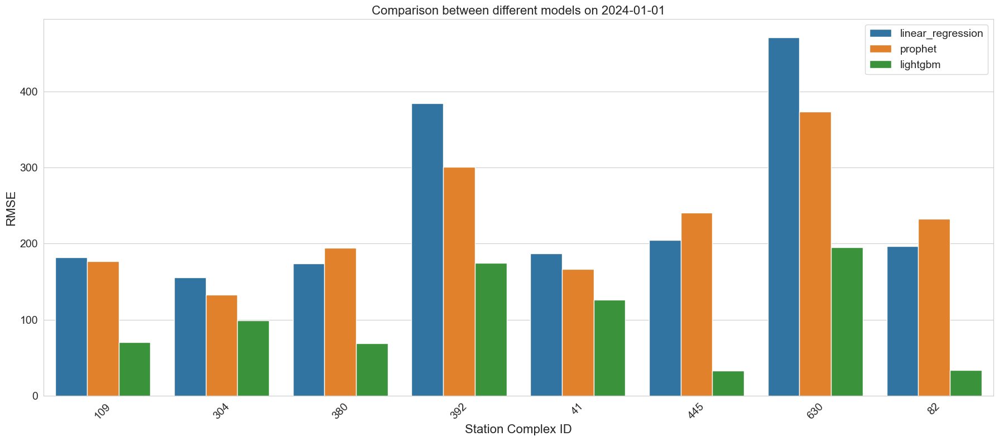

In [51]:
for date in df_results['starting_date'].unique():
    models = ['linear_regression', 'prophet', 'lightgbm']
    data_subset = df_results[df_results['starting_date'] == date]

    melted_data = data_subset.melt(id_vars=['station_complex_id'], 
                                   value_vars=[f"{model}_train_rmse" for model in models],
                                   var_name='model', value_name='RMSE')

    melted_data['model'] = melted_data['model'].replace({f"{model}_train_rmse": model for model in models})

    plt.figure(figsize=(18, 8))
    sns.barplot(data=melted_data, x='station_complex_id', y='RMSE', hue='model')

    plt.title(f'Comparison between different models on {date}', fontsize=16)
    plt.xlabel('Station Complex ID', fontsize=16)
    plt.ylabel('RMSE', fontsize=16)
    plt.yticks(fontsize=14)
    plt.xticks(rotation=45, fontsize=14)
    plt.tight_layout()
    plt.legend(fontsize=14)

    plt.show()

#### Result Analysis

1. Performance Variation Across Stations:
- RMSE values vary greatly across station complexes, which indicates differences in prediction accuracy for each location. For instance, some stations like 304 and 392 have relatively low RMSE for LightGBM, suggesting better predictions, while stations like 41, 445, and 82 show high RMSE across all models, signaling challenges in prediction accuracy at those stations. This is highly correlated with the imputation method.

2. Model Comparison:
- LightGBM generally shows the lowest RMSE among the three models, indicating superior prediction performance.
- Linear Regression shows moderate performance but is outperformed by LightGBM. This suggests that the linearity assumption does not hold for all stations' data.
- Prophet has mixed results; it performs better than Linear Regression in some cases but is generally outperformed by LightGBM. This might be due to the fact that is good for stations that do not present huge variability, but poor on stations that ridership patterns change across time. 

4. Temporal Stability:
- The RMSE across different dates suggests that the model's performance is not consistent over time. This might be due to changing data patterns, external factors affecting ridership, or varying data quality over time.

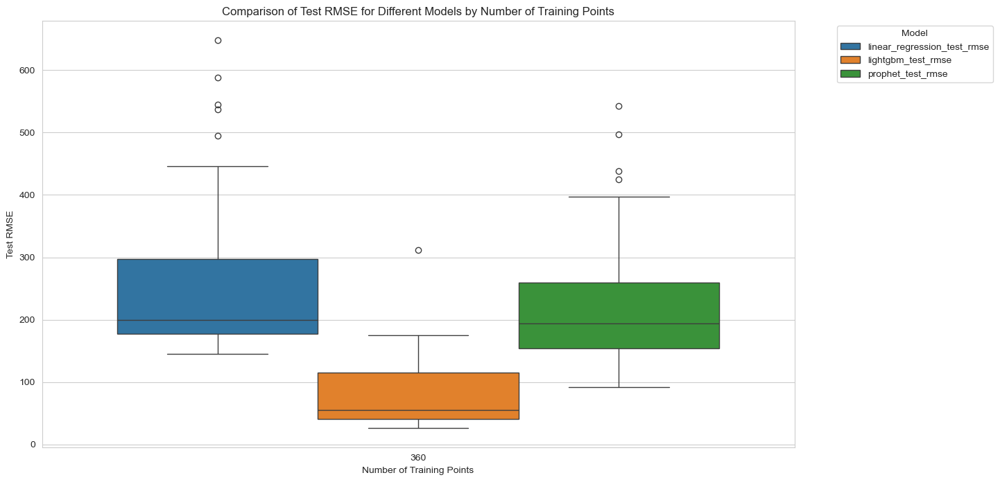

In [52]:
# Remelting the DataFrame with the adjusted data
df_melted = pd.melt(df_results, id_vars=['num_training_points'], value_vars=['linear_regression_test_rmse', 'lightgbm_test_rmse', 'prophet_test_rmse'], var_name='model', value_name='test_rmse')

# Creating a boxplot
plt.figure(figsize=(14, 8))
sns.boxplot(data=df_melted, x='num_training_points', y='test_rmse', hue='model')
plt.title('Comparison of Test RMSE for Different Models by Number of Training Points')
plt.xlabel('Number of Training Points')
plt.ylabel('Test RMSE')
plt.legend(title='Model', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

- The boxplot provides a visual summary of the distribution of test RMSE values for each model, indicating variability in model performance.
- Linear Regression has a wide interquartile range and outliers, suggesting that its performance is less consistent across the test set.
- Prophet and LightGBM have narrower interquartile ranges, implying more consistent performance,and has a lower median RMSE, suggesting better overall accuracy.

### Linear Regression Train / Test Metrics

In [53]:
df_model_agg_final.station_complex_id.value_counts() - df_model_agg.station_complex_id.value_counts()

station_complex_id
109     677
304     380
380      62
392      26
41     1399
445    1615
630      26
82     1866
Name: count, dtype: int64

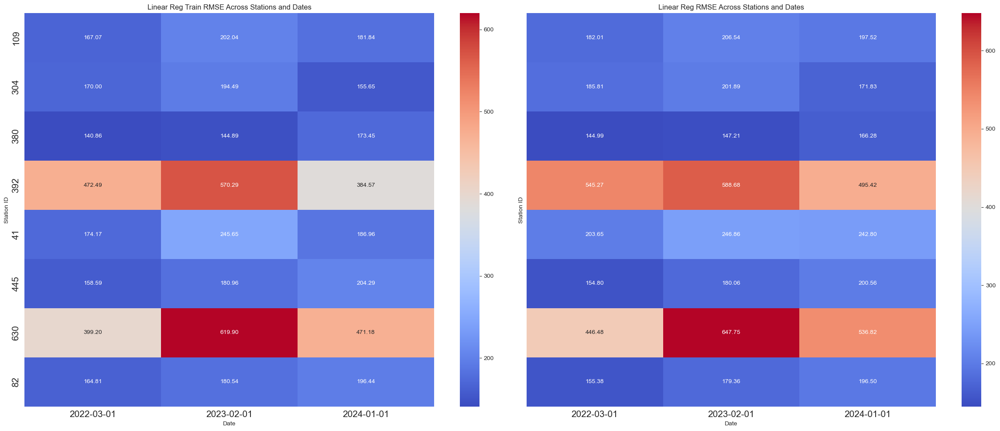

In [54]:
train_heatmap_data = pd.pivot_table(df_results, values='linear_regression_train_rmse', index='station_complex_id', columns='starting_date')
test_heatmap_data = pd.pivot_table(df_results, values='linear_regression_test_rmse', index='station_complex_id', columns='starting_date')

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(24, 10), sharey=True)

sns.heatmap(train_heatmap_data, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10}, ax=ax1)
ax1.set_title('Linear Reg Train RMSE Across Stations and Dates')
ax1.set_xlabel('Date')
ax1.set_ylabel('Station ID')
ax1.tick_params(axis='both', which='major', labelsize=15)

sns.heatmap(test_heatmap_data, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10}, ax=ax2)
ax2.set_title('Linear Reg RMSE Across Stations and Dates')
ax2.set_xlabel('Date')
ax2.set_ylabel('Station ID')
ax2.tick_params(axis='both', which='major', labelsize=15)

plt.tight_layout()
plt.show()

### Prophet Train / Test Metrics

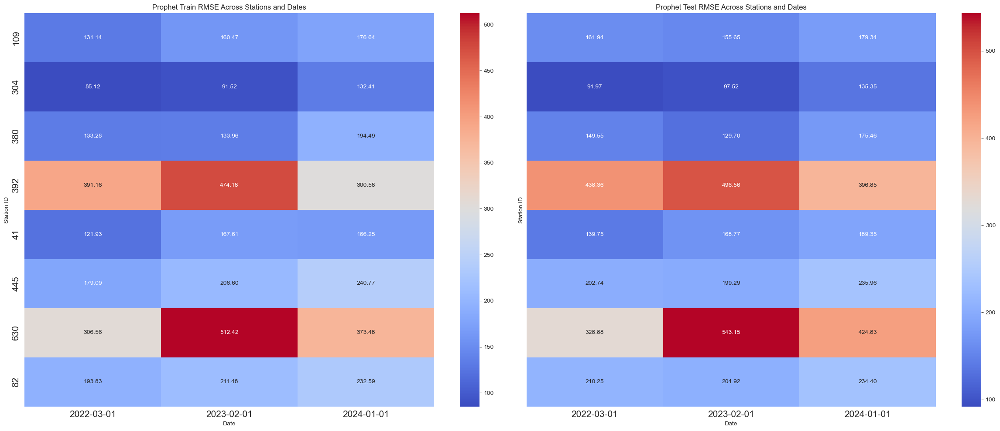

In [55]:
train_heatmap_data = pd.pivot_table(df_results, values='prophet_train_rmse', index='station_complex_id', columns='starting_date')
test_heatmap_data = pd.pivot_table(df_results, values='prophet_test_rmse', index='station_complex_id', columns='starting_date')

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(24, 10), sharey=True)

sns.heatmap(train_heatmap_data, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10}, ax=ax1)
ax1.set_title('Prophet Train RMSE Across Stations and Dates')
ax1.set_xlabel('Date')
ax1.set_ylabel('Station ID')
ax1.tick_params(axis='both', which='major', labelsize=15)

sns.heatmap(test_heatmap_data, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10}, ax=ax2)
ax2.set_title('Prophet Test RMSE Across Stations and Dates')
ax2.set_xlabel('Date')
ax2.set_ylabel('Station ID')
ax2.tick_params(axis='both', which='major', labelsize=15)

plt.tight_layout()
plt.show()

### LightGBM Train / Test Metrics

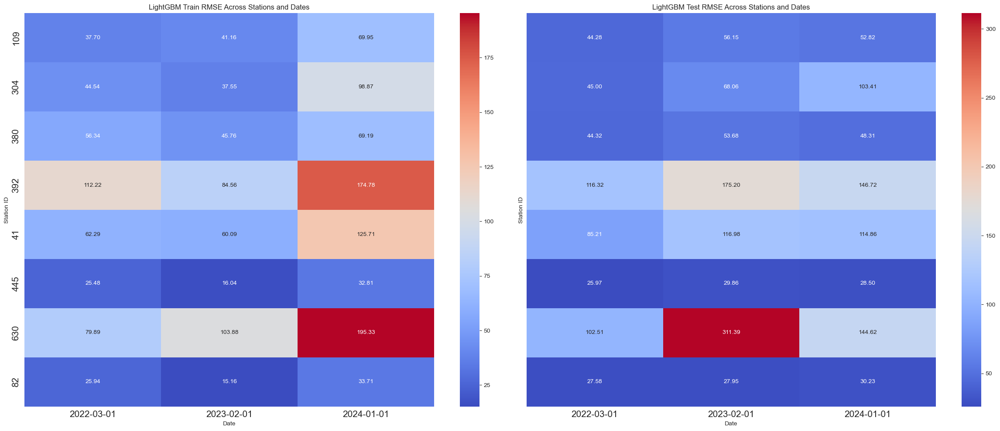

In [56]:
train_heatmap_data = pd.pivot_table(df_results, values='lightgbm_train_rmse', index='station_complex_id', columns='starting_date')
test_heatmap_data = pd.pivot_table(df_results, values='lightgbm_test_rmse', index='station_complex_id', columns='starting_date')

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(24, 10), sharey=True)

sns.heatmap(train_heatmap_data, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10}, ax=ax1)
ax1.set_title('LightGBM Train RMSE Across Stations and Dates')
ax1.set_xlabel('Date')
ax1.set_ylabel('Station ID')
ax1.tick_params(axis='both', which='major', labelsize=15)

sns.heatmap(test_heatmap_data, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10}, ax=ax2)
ax2.set_title('LightGBM Test RMSE Across Stations and Dates')
ax2.set_xlabel('Date')
ax2.set_ylabel('Station ID')
ax2.tick_params(axis='both', which='major', labelsize=15)

plt.tight_layout()
plt.show()

#### Result Analysis

1. Performance across Stations:
- Some stations consistently show lower RMSE values across all models and dates, such as Station 445 in the LightGBM Train heatmap. This suggests that for these stations, the models have a good fit and can predict the target variable with relatively high accuracy.
- Conversely, Station 392 displays high RMSE values across all models and dates, indicating a poorer fit. Such discrepancies can be due to several factors, such as the nature of the data at these stations being more volatile or less predictable.
  
2. Algorithmic Differences:
- Linear Regression seems to have a relatively higher RMSE compared to the other two models. This could be due to the simplicity of linear regression; it assumes a linear relationship between the features and the target, which might not hold true for complex datasets.
- Prophet, which is designed for time series forecasting, shows mixed results. For some stations, it performs significantly better (e.g., Station 304), while for others, it’s on par or worse than linear regression. Its performance might be tied to the station-specific time series characteristics like seasonality and trend changes, which Prophet is designed to handle.
- LightGBM consistently shows lower RMSE scores across most stations and dates.

It's not unusual for training metrics to sometimes be higher than testing metrics, though typically we expect the opposite. The usual expectation is that a model will perform better on the training set (lower RMSE) due to overfitting, where the model learns not only the underlying patterns but also the noise in the training data. However, when a model has a higher RMSE on training than testing, it might be due to several reasons:

- Underfitting.
- Data Distribution: If the test set has an easier-to-predict data distribution, or it happens to contain points that are close to the training set points, the model may perform unexpectedly well.
- Regularization and Early Stopping: If the training process includes regularization techniques or early stopping, it might prevent overfitting, leading to better generalization on the test set.


### MAPE Analysis

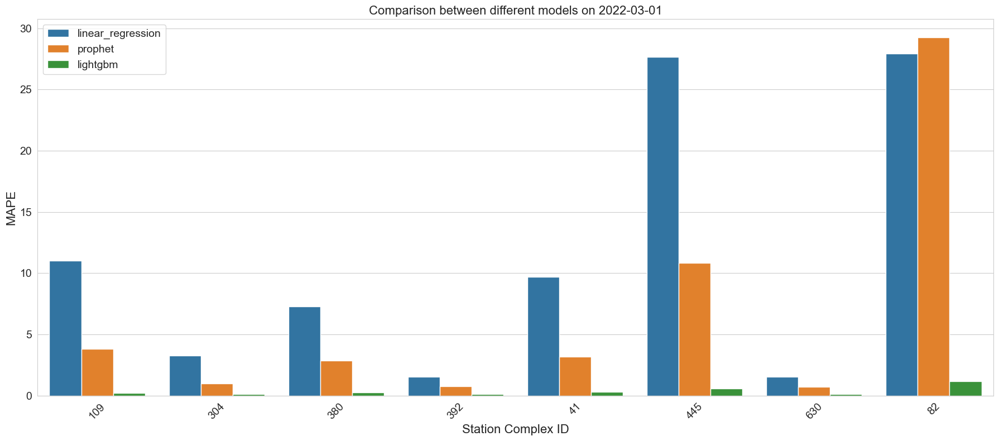

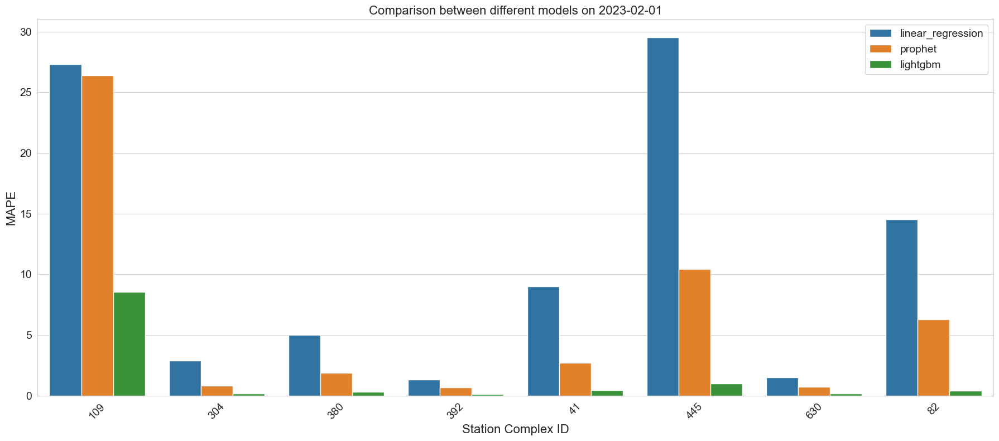

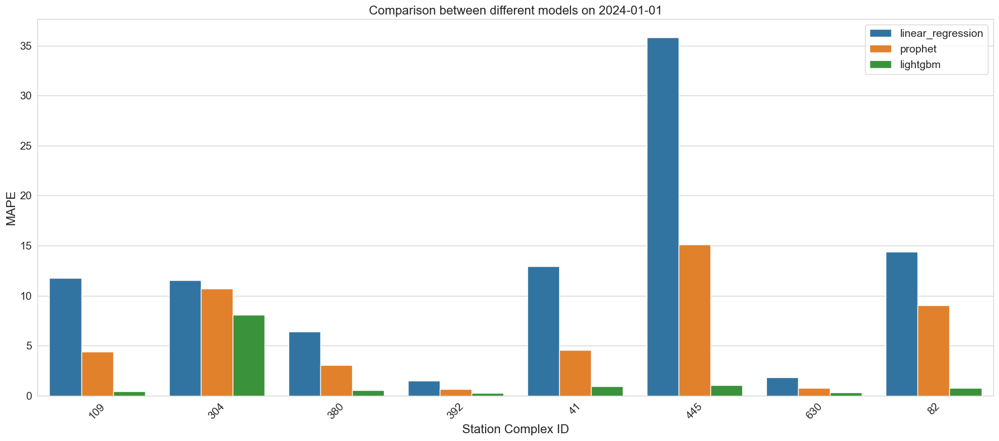

In [57]:
for date in df_results['starting_date'].unique():
    models = ['linear_regression', 'prophet', 'lightgbm']
    data_subset = df_results[df_results['starting_date'] == date]

    melted_data = data_subset.melt(id_vars=['station_complex_id'], 
                                   value_vars=[f"{model}_train_mape" for model in models],
                                   var_name='model', value_name='MAPE')

    melted_data['model'] = melted_data['model'].replace({f"{model}_train_mape": model for model in models})

    plt.figure(figsize=(18, 8))
    sns.barplot(data=melted_data, x='station_complex_id', y='MAPE', hue='model')

    plt.title(f'Comparison between different models on {date}', fontsize=16)
    plt.xlabel('Station Complex ID', fontsize=16)
    plt.ylabel('MAPE', fontsize=16)
    plt.yticks(fontsize=14)
    plt.xticks(rotation=45, fontsize=14)
    plt.tight_layout()
    plt.legend(fontsize=14)

    plt.show()

1. Station-Specific Performance:
- There are significant variations in the MAPE for different stations, indicating that the models' accuracy varies widely depending on the station. For example, Station 445 shows extremely high MAPE for Linear Regression and Prophet on certain dates, suggesting that the models are not capturing the underlying pattern effectively for this station.
- Stations like 380, 392, and 630 show low MAPEs for LightGBM, indicating that this model performs well at these stations.

3. Algorithmic Performance:
- Linear Regression generally has higher MAPEs compared to LightGBM, which aligns with the expectation that more complex models can capture non-linear patterns better.
- Prophet seems to perform variably; while it does outperform Linear Regression in some cases, it is generally outperformed by LightGBM. This suggests that the time series data characteristics at certain stations may be better captured by the gradient boosting methods of LightGBM.
- LightGBM consistently shows lower MAPEs, reiterating its strength in handling variable patterns in the data.

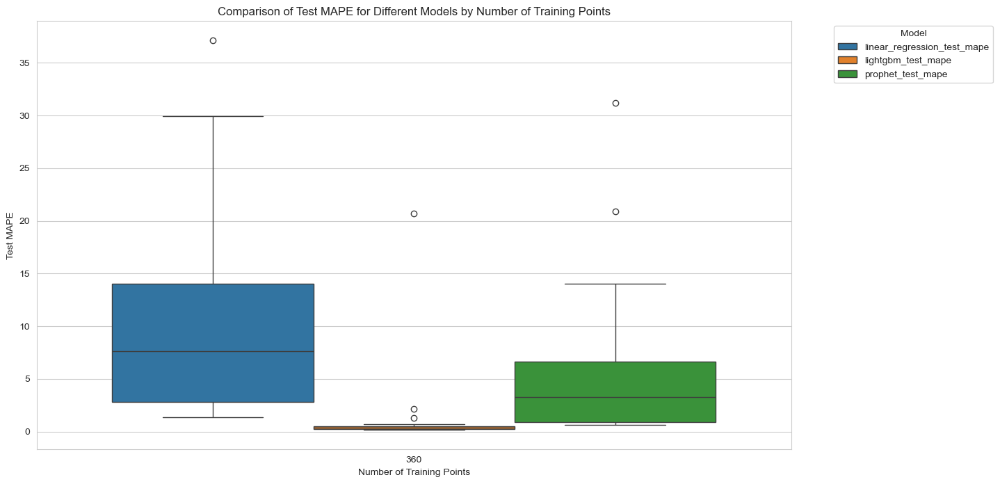

In [58]:
# Remelting the DataFrame with the adjusted data
df_melted = pd.melt(df_results, id_vars=['num_training_points'], value_vars=['linear_regression_test_mape', 'lightgbm_test_mape', 'prophet_test_mape'], var_name='model', value_name='test_mape')

# Creating a boxplot
plt.figure(figsize=(14, 8))
sns.boxplot(data=df_melted, x='num_training_points', y='test_mape', hue='model')
plt.title('Comparison of Test MAPE for Different Models by Number of Training Points')
plt.xlabel('Number of Training Points')
plt.ylabel('Test MAPE')
plt.legend(title='Model', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

- Outliers: The presence of outliers, as shown in the boxplot for Linear Regression and Prophet, indicates that there are some stations where the error is significantly higher than the median.
- LightGBM's Consistency: The compactness of the box for LightGBM indicates that its performance is more consistent across different stations and times, with fewer outliers, highlighting its robustness as a model.
  
If I had more time, my analysis would not stop at observing these discrepancies. It would be essential to investigate the reasons behind the variability in performance. For instance, does Station 445 have unique characteristics that make forecasting more challenging (like the number of missing values that needed interpolation)?

### Linear Regression Train / Test Metrics

In [107]:
df_model_agg_final.station_complex_id.value_counts() - df_model_agg.station_complex_id.value_counts()

station_complex_id
109     677
304     380
380      62
392      26
41     1399
445    1615
630      26
82     1866
Name: count, dtype: int64

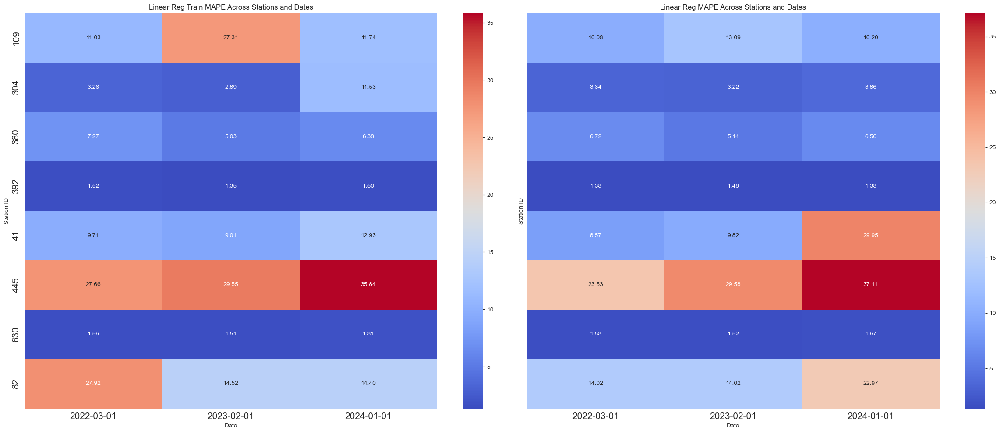

In [109]:
train_heatmap_data = pd.pivot_table(df_results, values='linear_regression_train_mape', index='station_complex_id', columns='starting_date')
test_heatmap_data = pd.pivot_table(df_results, values='linear_regression_test_mape', index='station_complex_id', columns='starting_date')

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(24, 10), sharey=True)

sns.heatmap(train_heatmap_data, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10}, ax=ax1)
ax1.set_title('Linear Reg Train MAPE Across Stations and Dates')
ax1.set_xlabel('Date')
ax1.set_ylabel('Station ID')
ax1.tick_params(axis='both', which='major', labelsize=15)

sns.heatmap(test_heatmap_data, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10}, ax=ax2)
ax2.set_title('Linear Reg MAPE Across Stations and Dates')
ax2.set_xlabel('Date')
ax2.set_ylabel('Station ID')
ax2.tick_params(axis='both', which='major', labelsize=15)

plt.tight_layout()
plt.show()

### Prophet Train / Test Metrics

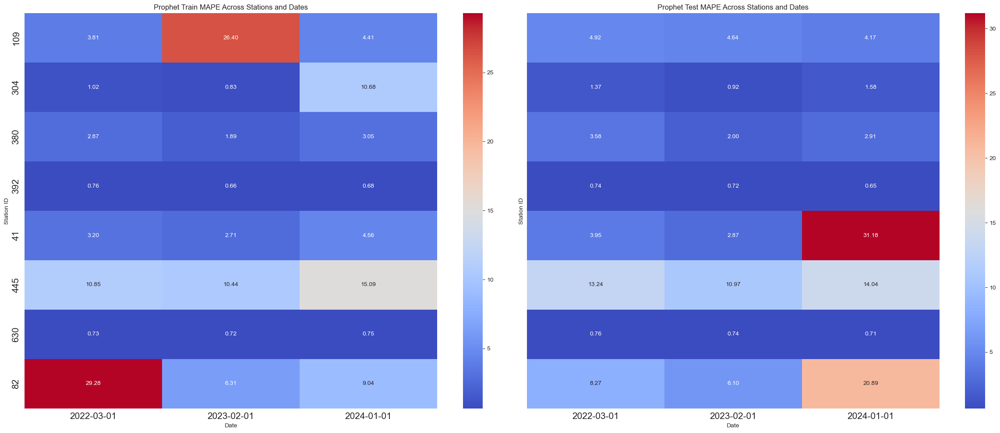

In [110]:
train_heatmap_data = pd.pivot_table(df_results, values='prophet_train_mape', index='station_complex_id', columns='starting_date')
test_heatmap_data = pd.pivot_table(df_results, values='prophet_test_mape', index='station_complex_id', columns='starting_date')

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(24, 10), sharey=True)

sns.heatmap(train_heatmap_data, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10}, ax=ax1)
ax1.set_title('Prophet Train MAPE Across Stations and Dates')
ax1.set_xlabel('Date')
ax1.set_ylabel('Station ID')
ax1.tick_params(axis='both', which='major', labelsize=15)

sns.heatmap(test_heatmap_data, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10}, ax=ax2)
ax2.set_title('Prophet Test MAPE Across Stations and Dates')
ax2.set_xlabel('Date')
ax2.set_ylabel('Station ID')
ax2.tick_params(axis='both', which='major', labelsize=15)

plt.tight_layout()
plt.show()

### LightGBM Train / Test Metrics

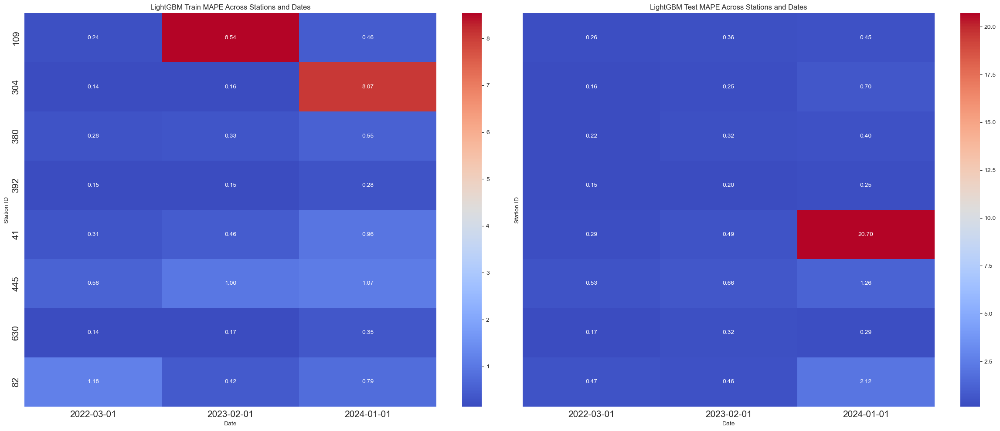

In [111]:
train_heatmap_data = pd.pivot_table(df_results, values='lightgbm_train_mape', index='station_complex_id', columns='starting_date')
test_heatmap_data = pd.pivot_table(df_results, values='lightgbm_test_mape', index='station_complex_id', columns='starting_date')

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(24, 10), sharey=True)

sns.heatmap(train_heatmap_data, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10}, ax=ax1)
ax1.set_title('LightGBM Train MAPE Across Stations and Dates')
ax1.set_xlabel('Date')
ax1.set_ylabel('Station ID')
ax1.tick_params(axis='both', which='major', labelsize=15)

sns.heatmap(test_heatmap_data, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10}, ax=ax2)
ax2.set_title('LightGBM Test MAPE Across Stations and Dates')
ax2.set_xlabel('Date')
ax2.set_ylabel('Station ID')
ax2.tick_params(axis='both', which='major', labelsize=15)

plt.tight_layout()
plt.show()

1. Linear Regression:

- Variation in Performance: The performance of Linear Regression varies significantly across stations and over time. Some stations show a relatively low MAPE, such as Station 392, indicating more accurate predictions. Meanwhile, Stations 445 and 82 exhibit high errors, especially on 2024-01-01, suggesting difficulties in predicting at these locations.
- Temporal Trends: There is a noticeable fluctuation in MAPE from one date to another, indicating that the Linear Regression model's performance may be influenced by factors varying over time, possibly seasonal trends or economic cycles that affect the data characteristics.
  
2. Prophet:

- Station-Specific Patterns: Prophet, being tailored for time series data, shows its strengths in certain stations, with Stations 380 and 392 consistently showing low MAPE. However, Station 82 has a very high MAPE on 2022-03-01 and 2024-01-01, hinting at some seasonal effect or anomaly in the data that Prophet is not capturing well.
- Consistency over Time: There seems to be less variance in Prophet's performance over time compared to Linear Regression, which may be due to its ability to model time series data with inherent trends and seasonality better.

3. LightGBM:

- Strong Performance: LightGBM presents exceptionally low MAPE values across almost all stations and dates, indicating a strong fit and predictive capability. The model is likely capturing complex patterns and interactions within the data effectively.
Anomalies: There are occasional spikes in MAPE at certain stations on specific dates (e.g., Station 82 on 2024-01-01), which could signal an anomaly in the data or an area where the model could be further tuned.

Key Observations:

- Stations 445 and 82: These stations have the highest MAPE values across all models, suggesting that there are unique challenges present at these locations, such as more volatile data or less predictable patterns.
- Station 392: This station consistently shows a low MAPE, indicating that the data here is well-modeled by all three methods, or the patterns are more regular and predictable.
- Temporal Effects: The fluctuating MAPE values over the different dates for each station suggest that there are temporal effects that influence model performance, which could be attributed to changes in external factors affecting the data.

# Final Questions

1. Model Serving Infrastructure:
   
- Use cloud services with managed scalability like AWS SageMaker, Google AI Platform, or Azure Machine Learning to deploy the models. These services provide autoscaling capabilities to handle varying loads, which is essential for scaling to all stations.
- Implement a microservices architecture with containerization (e.g., Docker) and orchestration (e.g., Kubernetes) to ensure that each station can have individualized models deployed if necessary.
  
2. API Layer:
- Develop a RESTful API for model inference to allow easy integration with existing systems and provide a uniform interface for different client applications.
- Ensure that the API can handle batch and real-time prediction requests to cater to both immediate forecasting needs and bulk analysis tasks.

3. Data Pipeline:
- Establish robust ETL (Extract, Transform, Load) pipelines to manage data ingestion, preprocessing, and feeding into the model for both training and inference.
- Ensure data quality and consistency checks are part of the pipeline to maintain high standards for the input data.

4. Maintenance Considerations:
- Regularly retrain models with new data to ensure they adapt to changes in ridership patterns.
- Work with SRE for alert tracking.
- Monitor model performance continuously with metrics such as RMSE and set up alerts for performance degradation on Slack if possible.
- Implement version control for models and data to ensure traceability and easy rollback in case of issues.

5. Scaling to All Stations:
- Apply feature stores to manage and serve features at scale to ensure consistency across training and prediction pipelines.
- Consider deploying a multi-tenant architecture if a single model is shared across stations to optimize resource utilization.

6. Incorporating External Data:
- Potential External Data Sources:
    - Weather data: Temperature, precipitation, and other weather conditions can impact ridership.
    - Event calendars: Local events can cause spikes or valleys in ridership.
    - Traffic data: Road traffic conditions may affect public transit usage.
      
7. Data Integration:
- Partner with data providers or use public APIs to integrate external data sources.
- For weather data, use APIs from services like OpenWeatherMap; for events data, scrape websites or use event aggregation services; for traffic data, use APIs from traffic management systems.
- Include a preprocessing step in the ETL pipeline that merges external data with station data based on timestamps and locations.
- Update the feature engineering process to include external data features.

8. Continuous Improvement Strategy:

- Experimentation Framework: Implement an A/B testing framework to compare new model versions against currently deployed ones based on a performance metric such as RMSE.

9. Model Monitoring and Feedback Loop:
- Set up a model monitoring system to track prediction accuracy, latency, and other operational metrics in real-time.
- Establish feedback mechanisms to capture ground truth data when available and use it to update/train the models.

10. Performance Gains Experiments:
- Feature Engineering: Experiment with additional external features and transformations to capture complex patterns.
- Hyperparameter Tuning: Use tools like (`hyperopt`) for tuning the model hyperparameters.
- Ensemble Methods: Experiment with different ensemble techniques like stacking or blending to combine predictions from LightGBM and Prophet.
- Transfer Learning: Explore using models pre-trained on similar datasets to leverage learned patterns.

# Future Work
- Further feature engineering.
- Improvements to the clustering algorithm and create features around that. 
- Explore residual distribution of LighGBM model to further evaluate it.
- Explore interpretability methods.
- Code hyper-parameter tuning for the different models.
